In [1]:
import pydicom
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
from math import ceil,floor
from scipy import ndimage
import skimage
import nibabel as nib
import ast

# Utility functions

## Open dicom folder

In [2]:
def read_dicomdir(dir_path: str) -> list:
    # opening the dicom files in the dir
    dicom_files = [
        os.path.join(dir_path, f) 
        for f in os.listdir(dir_path)
    ]
    
    # Sort the files based on slice location (for this patient is already done)
    dicom_files.sort(key=lambda x: pydicom.dcmread(x).InstanceNumber)
    
    # read the actual dicom files
    slices = [pydicom.dcmread(f) for f in dicom_files]
    
    return slices

## Reconstruct 3d shape

In [3]:
def get_3d_shape(dicom_slices: list) -> np.ndarray:
    pixel_arrays = [s.pixel_array for s in dicom_slices]

    # stack the slices to create a 3d array
    volume_3d = np.stack(pixel_arrays, axis=0)
    
    # flip the dicom on the vertical axis
    return volume_3d[:, ::-1, :]

## Read the 3d shape of a ROI

Sfortunatamente, quando si aprono le immagini con pydicom queste sono specchiate sull'asse y e sull'asse z, quindi vanno sistemate. Di questo ce ne siamo accorti quando abbiamo visto che le slice location sulla tabella non corrispondevano con la loro localizzazione sui file delle ROI.

In [5]:
def read_3d_rois(roi, slices_per_roi: int) -> dict:
    number_of_rois = int(roi.pixel_array.shape[0] / slices_per_roi)
    
    rois = [
        roi.pixel_array[
            i*slices_per_roi : (i+1) * slices_per_roi,
            :,
            :
        ][::-1, ::-1, :] # for each roi flip it on the vertical axis
        for i in range(number_of_rois)
    ]
    
    z_indexes = [
        [
            i
            for i in range(roi.shape[0]) if roi[i, :, :].flatten().any()
        ]
        for roi in rois
    ]
    
    y_indexes = [
        [
            i
            for i in range(roi.shape[1]) if roi[:, i, :].flatten().any()
        ]
        for roi in rois
    ]
    
    x_indexes = [
        [
            i
            for i in range(roi.shape[2]) if roi[:, :, i].flatten().any()
        ]
        for roi in rois
    ]

    return [
        {
            "z_indexes": z_index,
            "y_indexes": y_index,
            "x_indexes": x_index,
            "roi": roi
        }
        for z_index, y_index, x_index, roi in zip(z_indexes, y_indexes, x_indexes, rois)
    ]

In [6]:
def get_roi_size(roi: dict) -> tuple:
    if pd.isnull(roi):
        return roi
    else:
        x_off = max(roi["x_indexes"]) - min(roi["x_indexes"])
        y_off = max(roi["y_indexes"]) - min(roi["y_indexes"])
        z_off = max(roi["z_indexes"]) - min(roi["z_indexes"])
        return (z_off+1, y_off+1, x_off+1)

## Get number of bins for an histogram

In [7]:
def get_n_bins(array: np.ndarray) -> int:
    q75, q25 = np.percentile(array, [75, 25])
    iqr = q75 - q25

    bin_width = 2 * iqr * pow(np.size(array), -1/3)
    return int((np.max(array) - np.min(array))/bin_width)

# Patient 1

In [7]:
patient1_path = "/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-001/03-05-2004-NA-MRI BREASTS - Delayed contrast-93547/600.000000-Registered Ax T2 FSE-08519"
roi_filepath = "/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-001/03-05-2004-NA-MRI BREASTS - Delayed contrast-93547/500.000000-ROI-38451/1-1.dcm"

## Opening multiple slices

In [8]:
slices = read_dicomdir(patient1_path)
volume_3d = get_3d_shape(slices)

In [9]:
volume_3d.shape # axis system is (z,y,x)

(116, 512, 512)

### Axial 

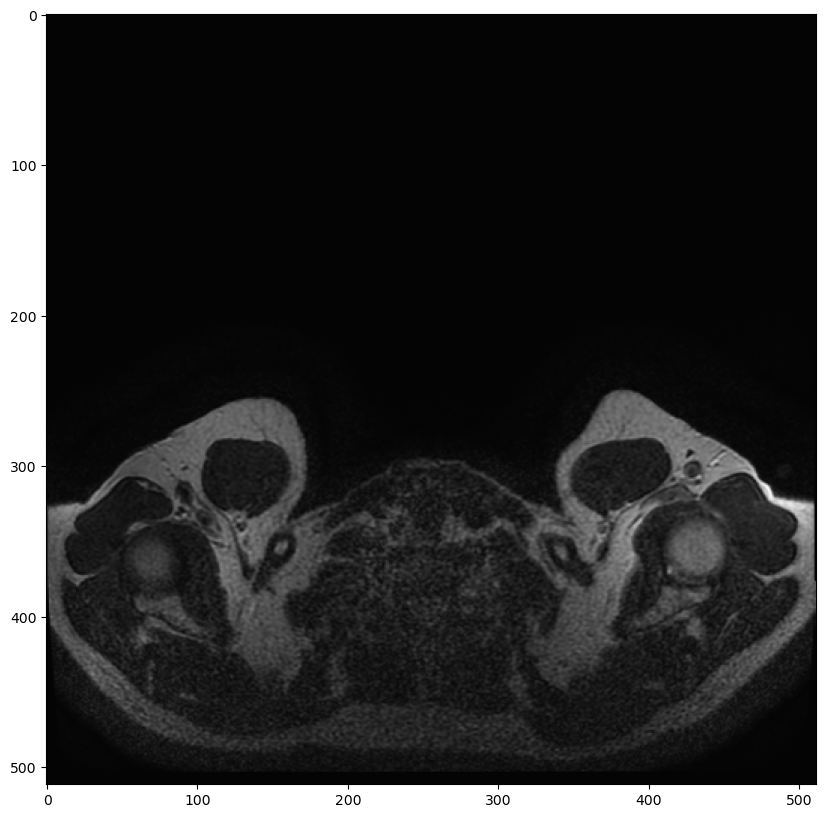

In [10]:
plt.figure(figsize = (10,10))
plt.imshow(volume_3d[1, :, :], cmap=plt.cm.gray)

### Coronal

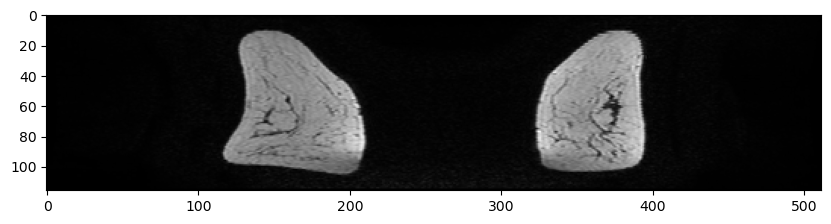

In [11]:
plt.figure(figsize = (10,10))
plt.imshow(volume_3d[:, 234, :], cmap=plt.cm.gray)

### Sagittal

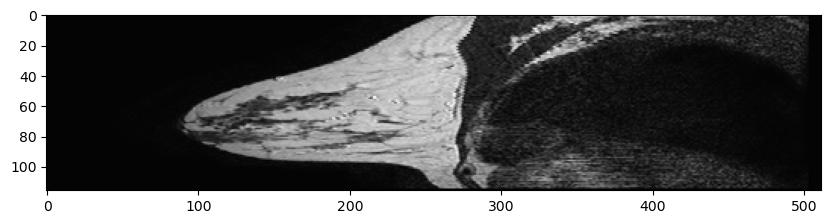

In [12]:
plt.figure(figsize = (10,10))
plt.imshow(volume_3d[:, :, 140], cmap=plt.cm.gray)

## Opening ROI

In [13]:
roi = pydicom.dcmread(roi_filepath)

## Overlapping ROI and MRI

In [14]:
rois = read_3d_rois(roi, 116)

### Left breast

In [15]:
rois[0]

{'z_indexes': [82, 83, 84, 85, 86, 87],
 'y_indexes': [172,
  173,
  174,
  175,
  176,
  177,
  178,
  179,
  180,
  181,
  182,
  183,
  184,
  185,
  186,
  187,
  188,
  189,
  190,
  191,
  192,
  193,
  194,
  195,
  196,
  197,
  198,
  199,
  200,
  201,
  202,
  203,
  204,
  205,
  206,
  207,
  208,
  209,
  210,
  211,
  212,
  213],
 'x_indexes': [142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
  158,
  159,
  160,
  161,
  162,
  163,
  164],
 'roi': array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0

Text(0.5, 1.0, 'z = 83 Slice Location = -56.8533783')

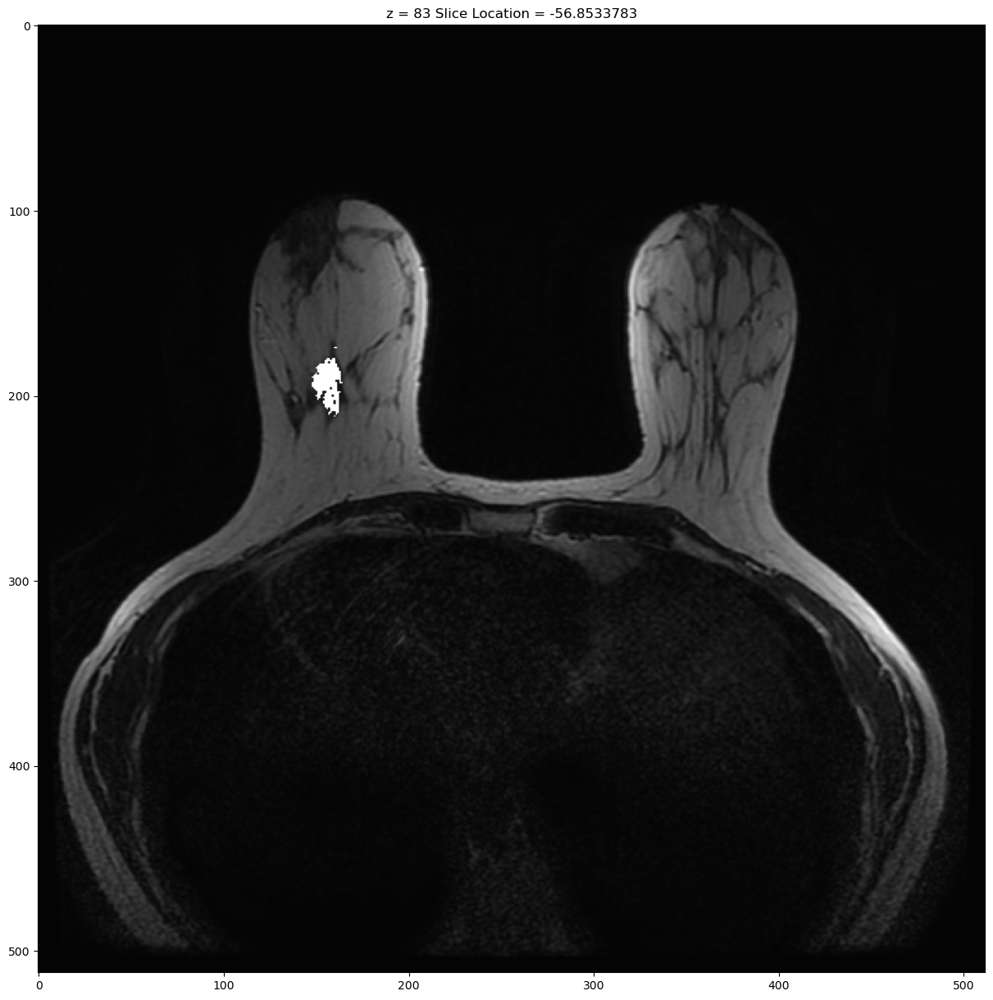

In [17]:
z = 83
plt.figure(figsize = (15,15))
plt.imshow(volume_3d[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[0]["roi"][z,:,:], cmap=plt.cm.gray, alpha=(rois[0]["roi"][z,:,:] > 0).astype(float) )
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

Text(0.5, 1.0, 'z = 87 Slice Location = -64.8533783')

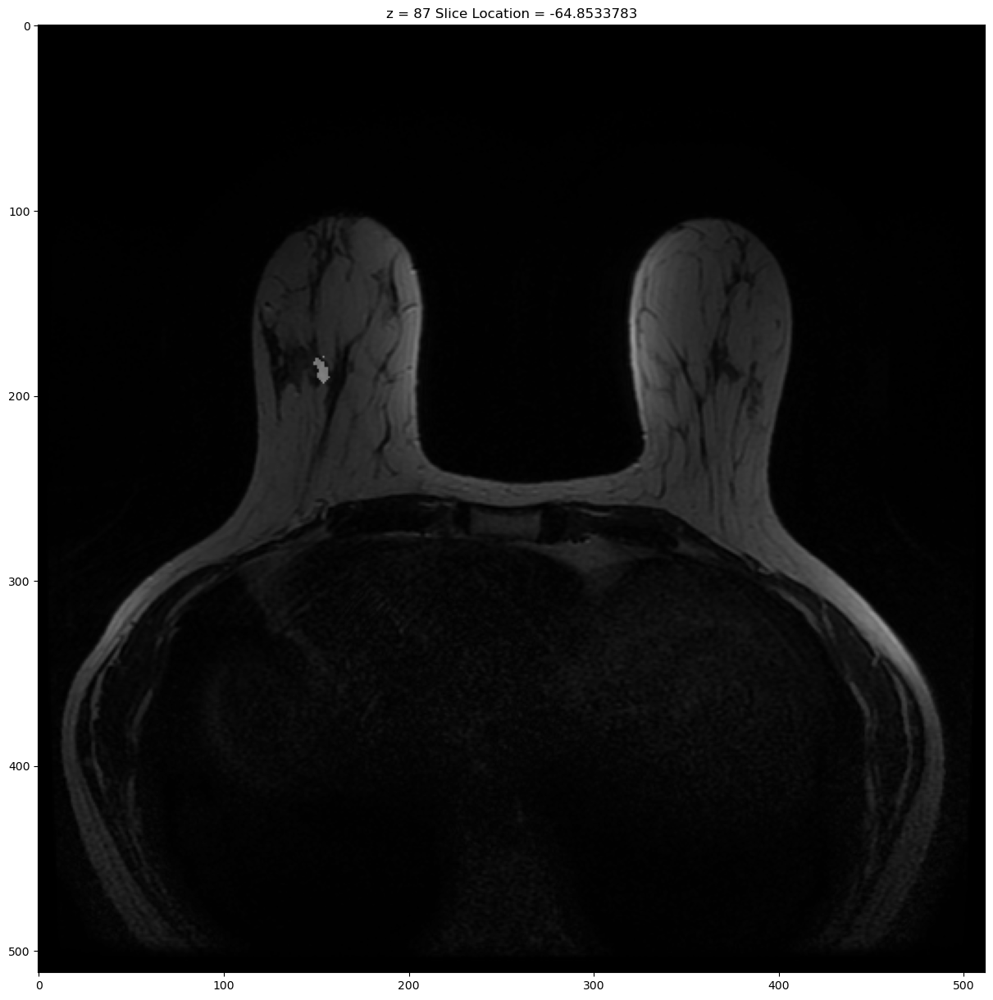

In [16]:
z = 87
plt.figure(figsize = (15,15))
plt.imshow(volume_3d[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[0]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

### Right breast

In [17]:
rois[1]

{'z_indexes': [82, 83, 84, 85],
 'y_indexes': [188,
  189,
  190,
  191,
  192,
  193,
  194,
  195,
  196,
  197,
  198,
  199,
  200,
  201,
  202,
  203,
  204,
  205,
  206,
  207,
  208,
  209,
  210,
  211,
  212,
  213,
  214,
  215,
  216,
  217,
  218,
  219,
  220,
  221,
  222,
  223,
  224,
  225,
  226,
  227,
  228,
  229,
  230,
  231,
  232,
  233],
 'x_indexes': [360,
  361,
  362,
  363,
  364,
  365,
  366,
  367,
  368,
  369,
  370,
  371,
  372,
  373,
  374,
  375,
  376],
 'roi': array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 

Text(0.5, 1.0, 'z = 82 Slice Location = -54.8533783')

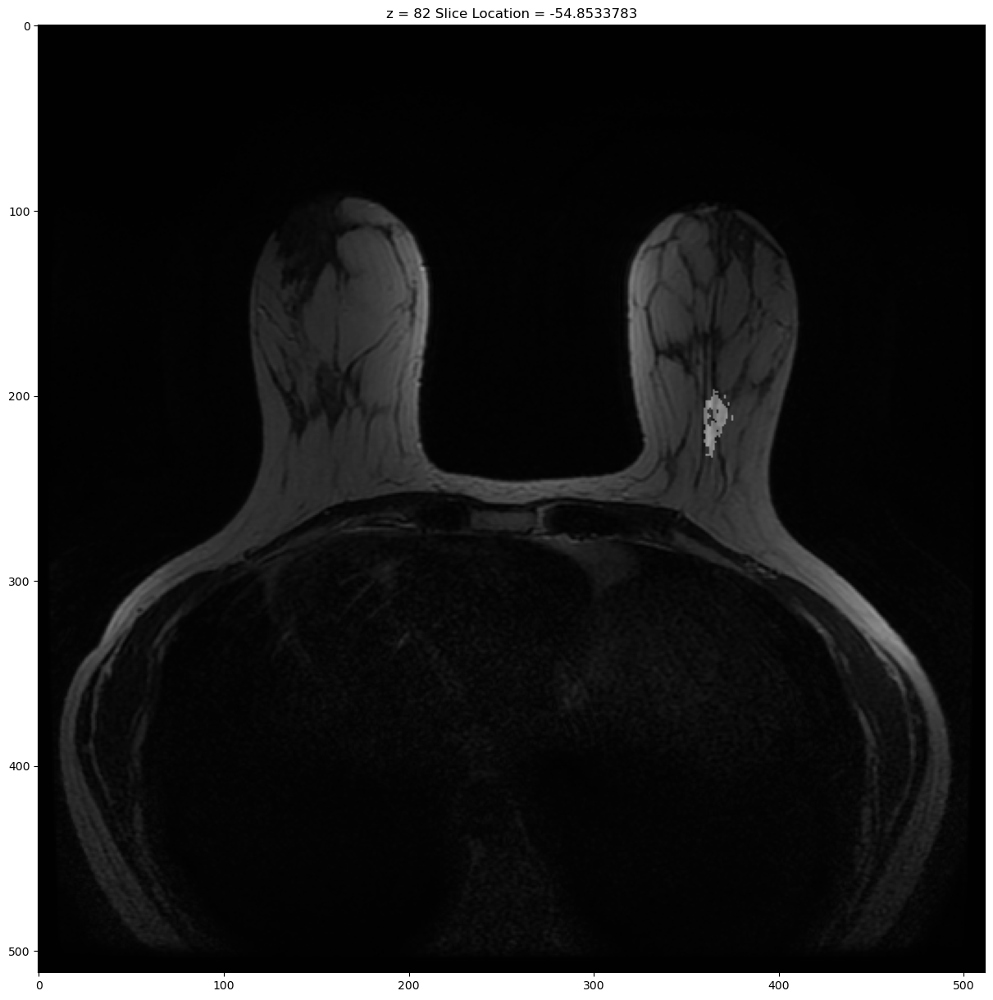

In [18]:
z = 82
plt.figure(figsize = (15,15))
plt.imshow(volume_3d[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[1]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

Text(0.5, 1.0, 'z = 85 Slice Location = -60.8533783')

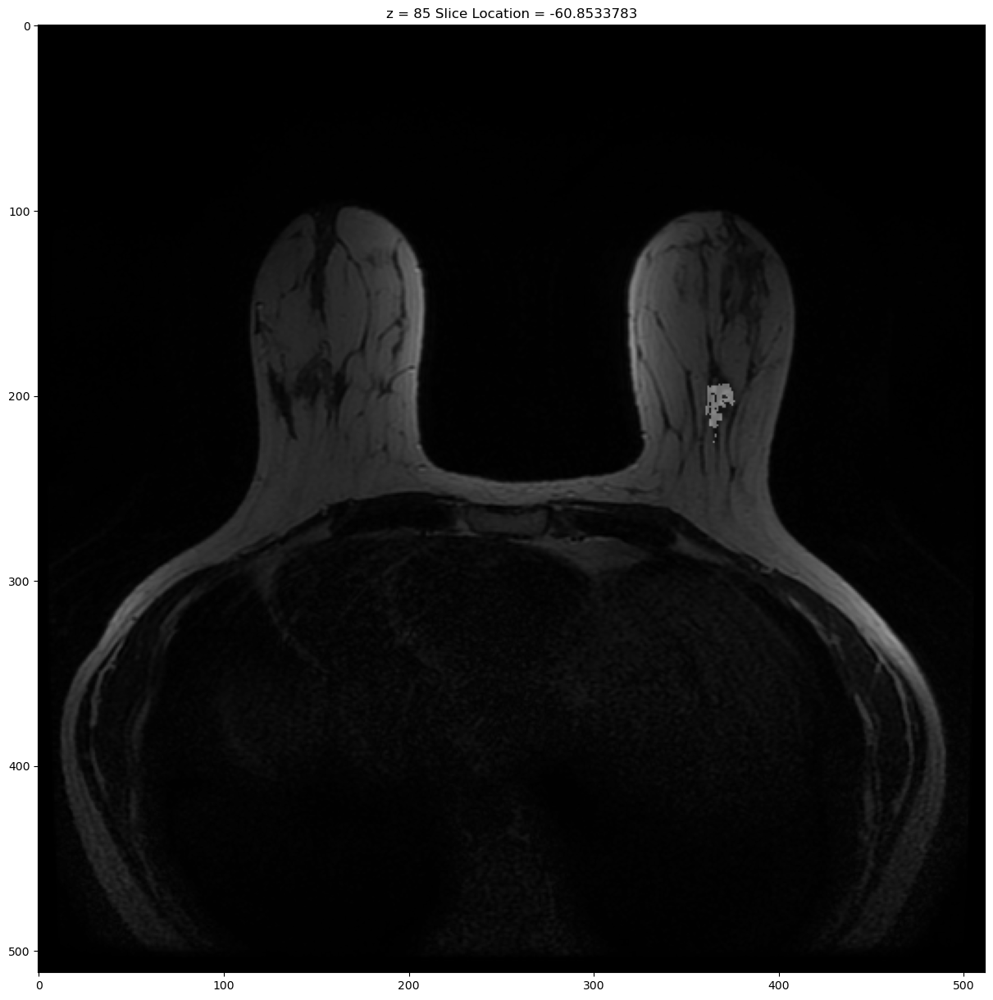

In [19]:
z = 85
plt.figure(figsize = (15,15))
plt.imshow(volume_3d[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[1]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

# Patient 3

In [20]:
patient3_path = "/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-003/03-05-2004-NA-MRI BREASTS - Delayed contrast-72782/600.000000-Registered Ax T2 FSE-92268"
roi3_filepath = "/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-003/03-05-2004-NA-MRI BREASTS - Delayed contrast-72782/500.000000-ROI-23921/1-1.dcm"

patient3_slices = read_dicomdir(patient3_path)
patient3_3dmodel = get_3d_shape(patient3_slices)

In [21]:
patient3_3dmodel.shape

(112, 512, 512)

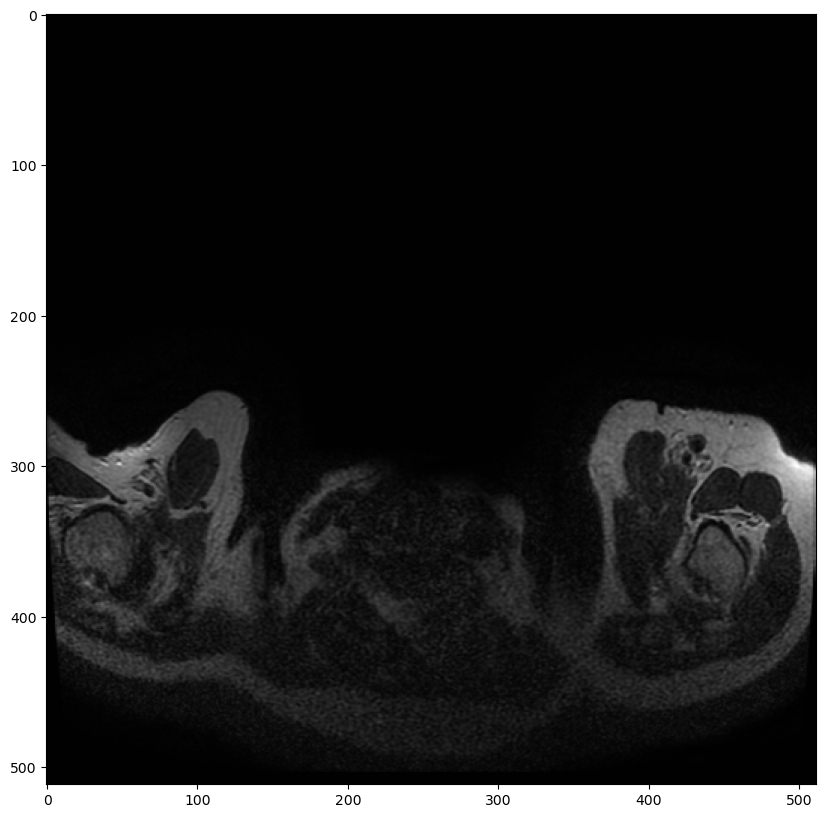

In [22]:
plt.figure(figsize = (10,10))
plt.imshow(patient3_3dmodel[1, :, :], cmap=plt.cm.gray)

In [23]:
roi3 = pydicom.dcmread(roi3_filepath)

In [24]:
rois = read_3d_rois(roi3, 112)

In [25]:
rois[0]

{'z_indexes': [49, 50, 51, 52, 53, 54, 55],
 'y_indexes': [178,
  179,
  180,
  181,
  182,
  183,
  184,
  185,
  186,
  187,
  188,
  189,
  190,
  191,
  192,
  193,
  194,
  195,
  196,
  197,
  198,
  199,
  200,
  201,
  202,
  203,
  204,
  205,
  206,
  207,
  208,
  209,
  210,
  211,
  212,
  213,
  214,
  215,
  216,
  217],
 'x_indexes': [357,
  358,
  359,
  360,
  361,
  362,
  363,
  364,
  365,
  366,
  367,
  368,
  369,
  370,
  371,
  372,
  373,
  374,
  375,
  376,
  377],
 'roi': array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0,

Text(0.5, 1.0, 'z = 49 Slice Location = 3.244155884')

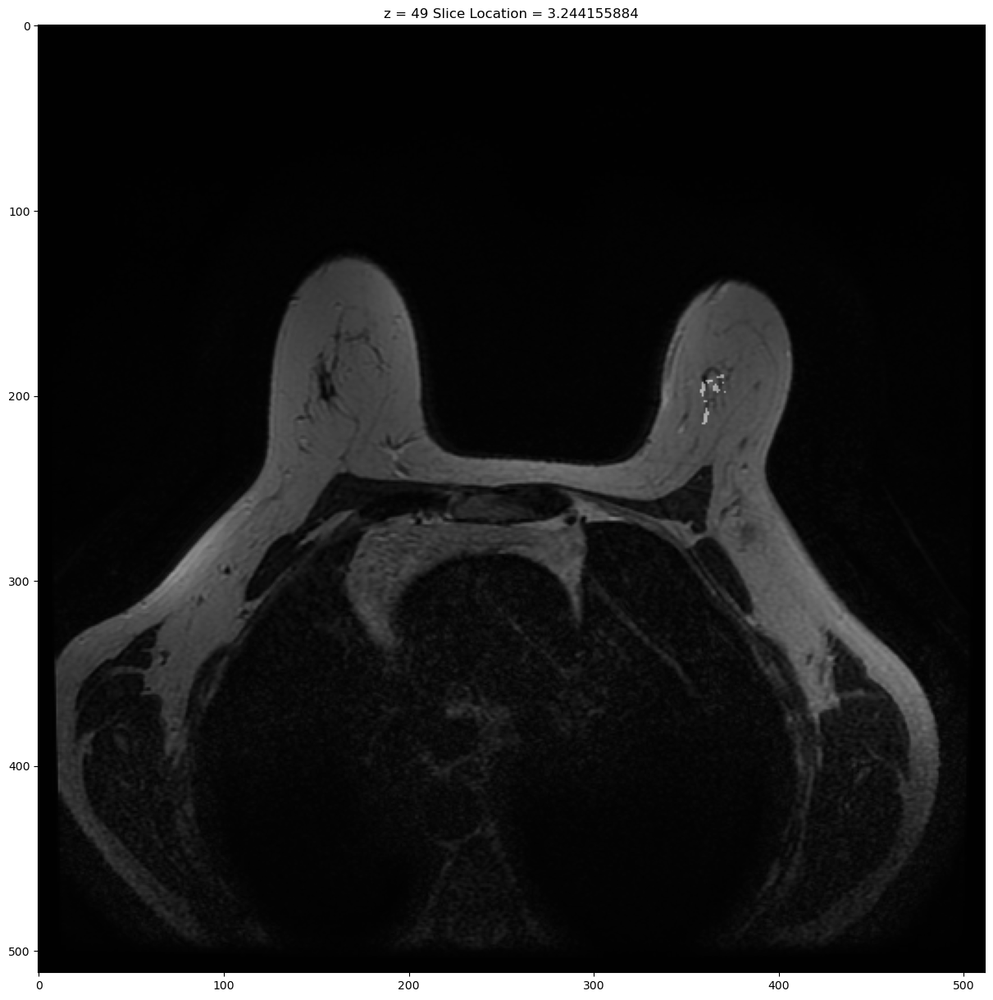

In [26]:
z = 49
plt.figure(figsize = (15,15))
plt.imshow(patient3_3dmodel[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[0]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {patient3_slices[z].SliceLocation}")

In [27]:
rois[0]

{'z_indexes': [49, 50, 51, 52, 53, 54, 55],
 'y_indexes': [178,
  179,
  180,
  181,
  182,
  183,
  184,
  185,
  186,
  187,
  188,
  189,
  190,
  191,
  192,
  193,
  194,
  195,
  196,
  197,
  198,
  199,
  200,
  201,
  202,
  203,
  204,
  205,
  206,
  207,
  208,
  209,
  210,
  211,
  212,
  213,
  214,
  215,
  216,
  217],
 'x_indexes': [357,
  358,
  359,
  360,
  361,
  362,
  363,
  364,
  365,
  366,
  367,
  368,
  369,
  370,
  371,
  372,
  373,
  374,
  375,
  376,
  377],
 'roi': array([[[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         ...,
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0, ..., 0, 0, 0]],
 
        [[0, 0, 0, ..., 0, 0, 0],
         [0, 0, 0,

# Inconsistencies in data

## AMBL-595 
Expected lesions: L22.86 and R-45.34

Both the lesions are on the left

In [7]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-595/04-12-2006-NA-MRI BREASTS - Delayed contrast-99337/600.000000-Registered Ax T2 FSE-16358")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-595/04-12-2006-NA-MRI BREASTS - Delayed contrast-99337/500.000000-ROI-96750/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [8]:
print(rois[0]["z_indexes"]) # L22.86
print(rois[1]["z_indexes"]) # L-45.34

[51, 52, 53, 54]
[83, 84, 85]


Text(0.5, 1.0, 'z = 53 Slice Location = 22.86351395')

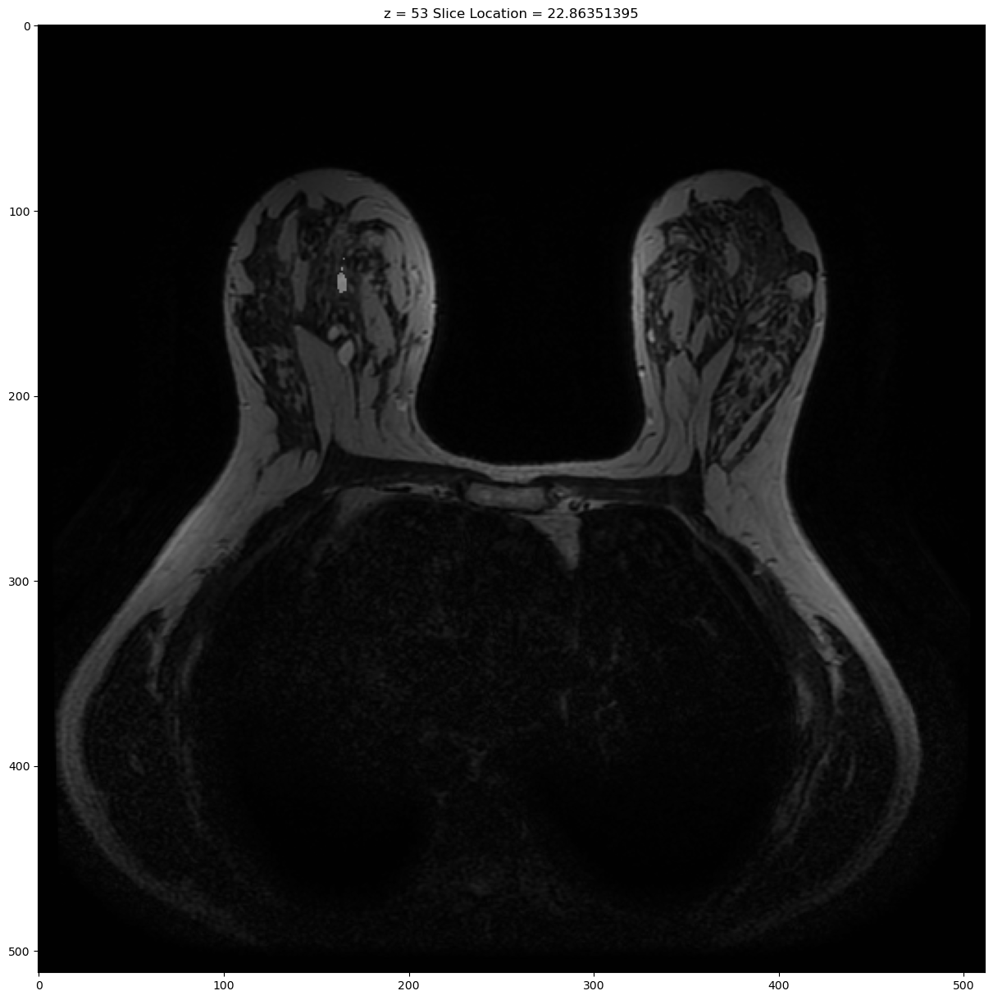

In [9]:
z = 53
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[0]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

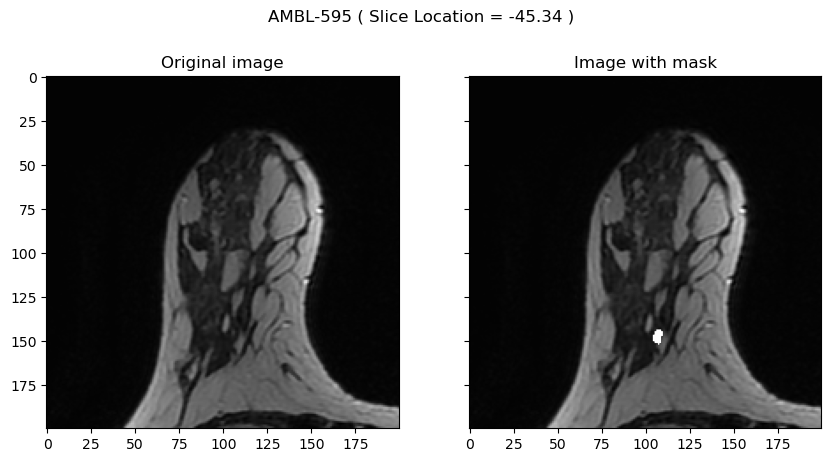

In [29]:
z = 84

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
fig.suptitle(f"AMBL-595 ( Slice Location = {slices[z].SliceLocation: .2f} )")

axes[0].imshow(patient_3d_model[z, 50:250, 50:250], cmap=plt.cm.gray)
axes[0].set_title("Original image")

axes[1].imshow(patient_3d_model[z, 50:250, 50:250], cmap=plt.cm.gray)
axes[1].imshow(rois[1]["roi"][z,50:250,50:250], cmap=plt.cm.gray, alpha= ( rois[1]["roi"][z,50:250,50:250] > 0).astype(float) )
axes[1].set_title("Image with mask")

plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/ambl-595")

## AMBL-629
Expected lesions: L39.93, R-2.07, R-20.07, R1.93, R-48.07 and R-32.07. There is one lesion in right breast between 7.92 and 3.92, which is not present in the excel. However, by excluding all the other lesions, R1.93 is the most plausible one


In [30]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-629/01-30-2007-NA-MRI BREASTS - Delayed contrast-40670/600.000000-Registered Ax T2 FSE-05708")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-629/01-30-2007-NA-MRI BREASTS - Delayed contrast-40670/500.000000-ROI-75632/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [31]:
print(rois[0]["z_indexes"]) # L39.93
print(rois[1]["z_indexes"]) # R-2.07
print(rois[2]["z_indexes"]) # R-20.07
print(rois[3]["z_indexes"]) # R1.93
print(rois[4]["z_indexes"]) # R-48.07
print(rois[5]["z_indexes"]) # R-32.07

[37, 38, 39, 40, 41, 42]
[58, 59, 60, 61]
[67, 68, 69, 70, 71]
[55, 56, 57]
[81, 82]
[73, 74, 75]


Text(0.5, 1.0, 'z = 75 Slice Location = -32.07292938')

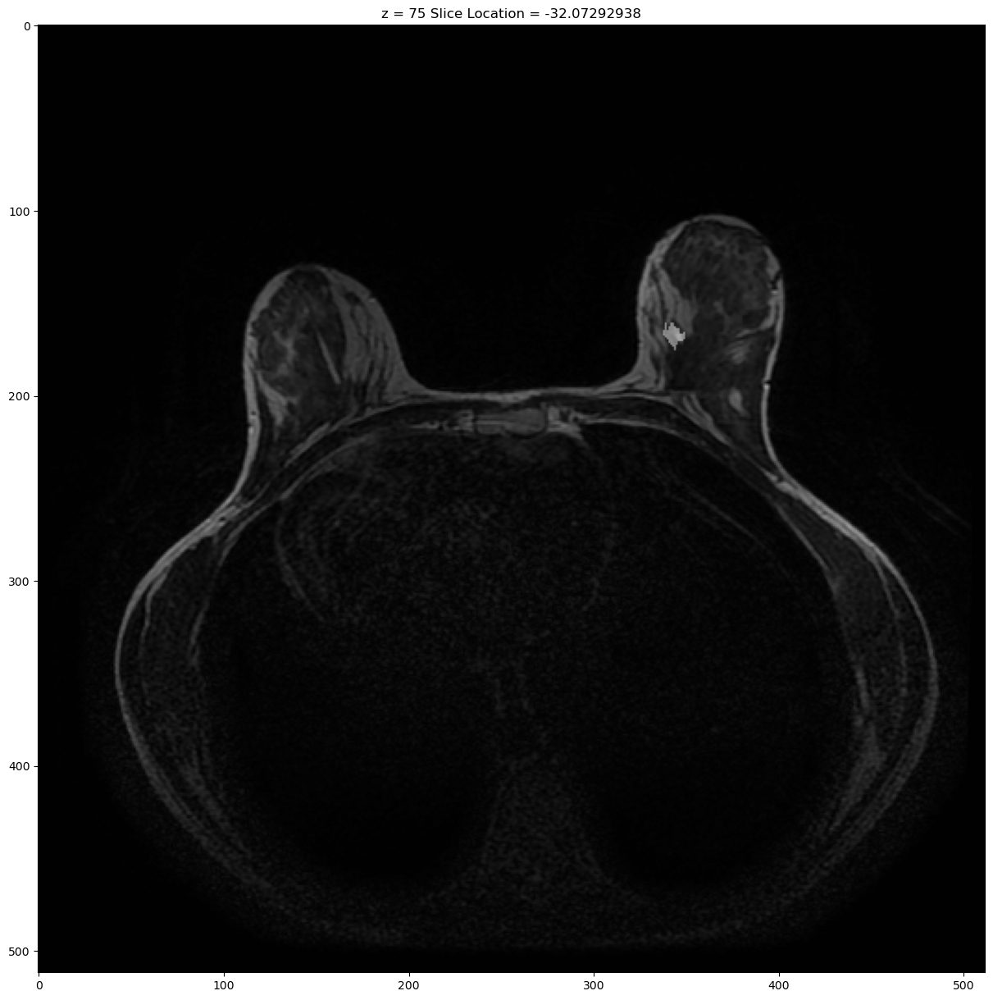

In [32]:
z = 75
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[5]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

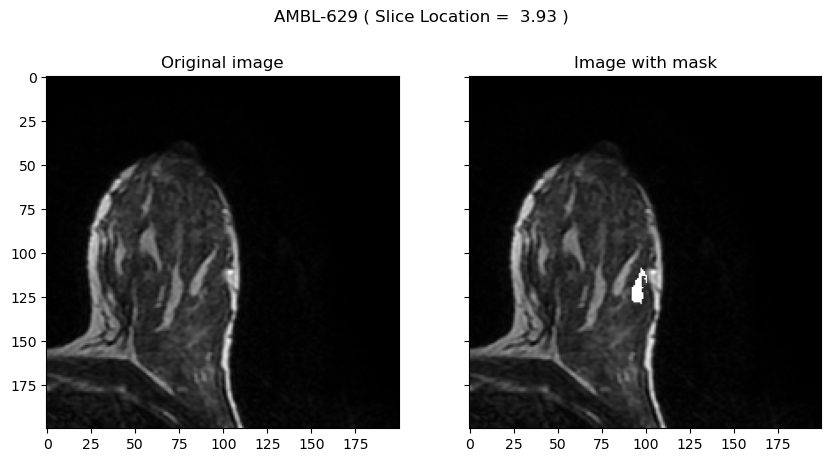

In [36]:
z = 57

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
fig.suptitle(f"AMBL-629 ( Slice Location = {slices[z].SliceLocation: .2f} )")

axes[0].imshow(patient_3d_model[z, 50:250, 300:500], cmap=plt.cm.gray)
axes[0].set_title("Original image")

axes[1].imshow(patient_3d_model[z, 50:250, 300:500], cmap=plt.cm.gray)
axes[1].imshow(rois[3]["roi"][z, 50:250, 300:500], cmap=plt.cm.gray, alpha= ( rois[3]["roi"][z, 50:250, 300:500] > 0).astype(float) )
axes[1].set_title("Image with mask")

plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/ambl-629")

## AMBL-572

Expected the following lesions: R-11.00, L-21, R-51, L-11, L-27

In [36]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-572/11-25-2005-NA-MRI BREASTS - Delayed contrast-51529/600.000000-Registered Ax T2 FSE-43029")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-572/11-25-2005-NA-MRI BREASTS - Delayed contrast-51529/500.000000-ROI-99161/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [37]:
print(rois[0]["z_indexes"]) # R-51
print(rois[1]["z_indexes"]) # L-11
print(rois[2]["z_indexes"]) # L-27
print(rois[3]["z_indexes"]) # R-11
print(rois[4]["z_indexes"]) # L-21

[77, 78, 79, 80, 81, 82, 83, 84, 85]
[59, 60, 61]
[67, 68, 69]
[60, 61, 62, 63]
[65, 66, 67]


Text(0.5, 1.0, 'z = 67 Slice Location = -22.99975586')

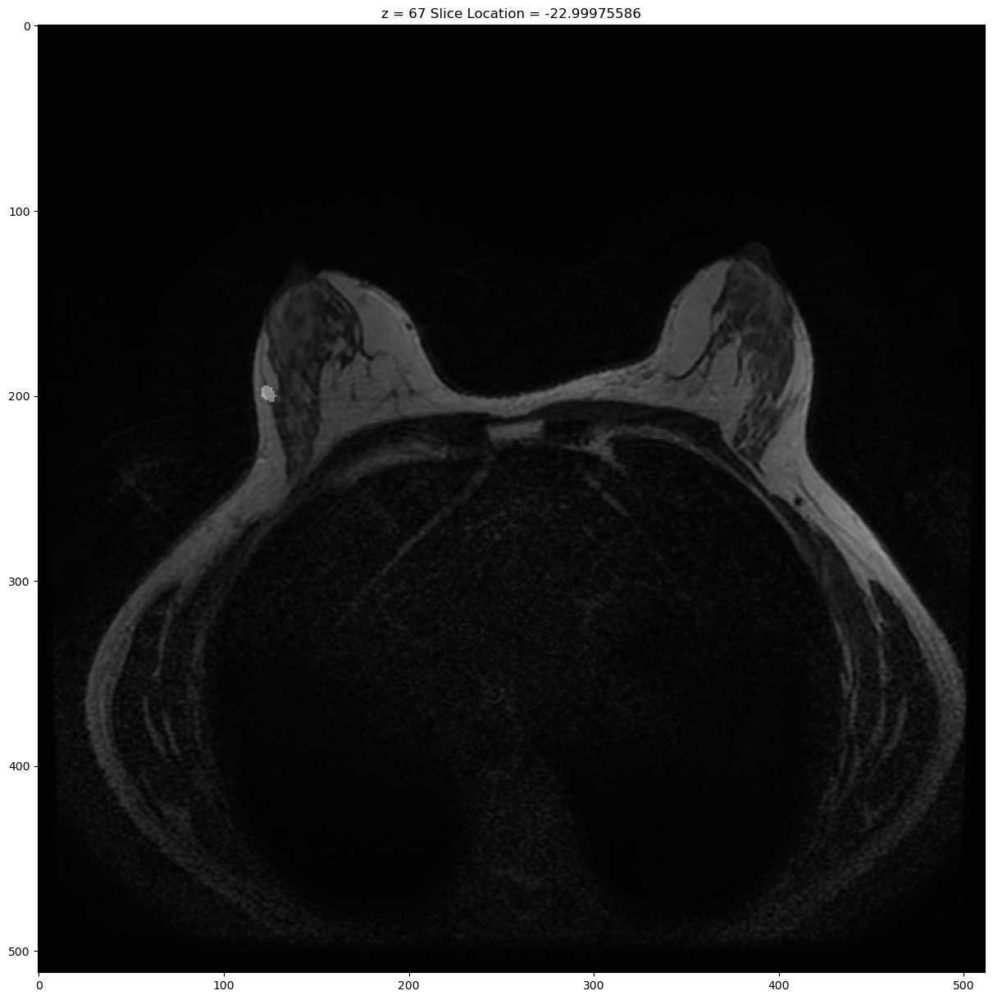

In [38]:
z = 67
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[4]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

## AMBL-579

Expected the following lesions: R-42.57, R-40.57. Both are tumor

In [39]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-579/12-21-2005-NA-MRI BREASTS - Delayed contrast-84296/600.000000-Registered Ax T2 FSE-17158")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-579/12-21-2005-NA-MRI BREASTS - Delayed contrast-84296/500.000000-ROI-89400/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [40]:
print(rois[0]["z_indexes"]) # R-42.57
print(rois[1]["z_indexes"]) # R-40.57

[71, 72, 73, 74, 75, 76, 77, 78]
[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]


Text(0.5, 1.0, 'z = 73 Slice Location = -36.57317352')

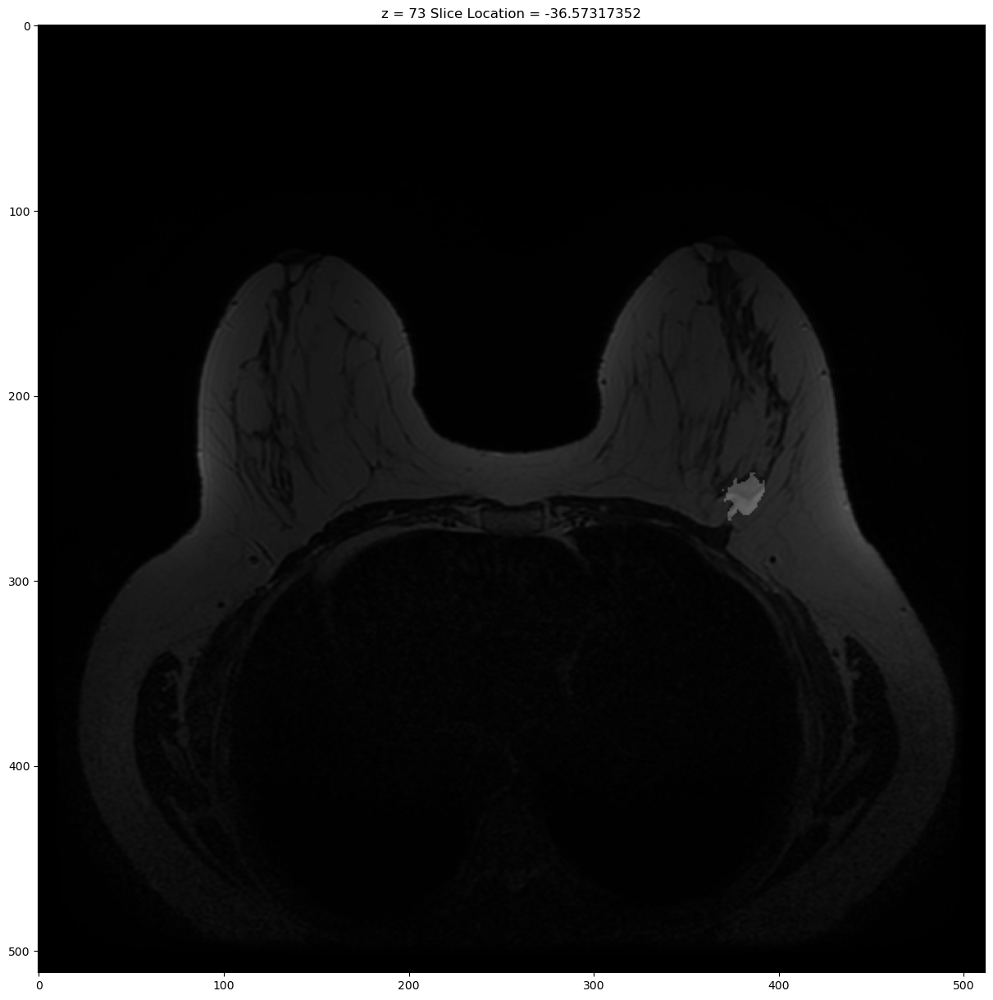

In [41]:
z = 73
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[0]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.imshow(rois[1]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

## AMBL-590

L37.31, L-13.27, L8.71, R-22.09, R-24.29. Both lesions on the right are benign

In [42]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-590/02-08-2006-NA-MRI BREASTS - Delayed contrast-70942/600.000000-Registered Ax T2 FSE-54767")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-590/02-08-2006-NA-MRI BREASTS - Delayed contrast-70942/500.000000-ROI-91209/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [43]:
print(rois[0]["z_indexes"]) # R-22.09
print(rois[1]["z_indexes"]) # R-24.29
print(rois[2]["z_indexes"]) # L8.71
print(rois[3]["z_indexes"]) # L37.31
print(rois[4]["z_indexes"]) # L-13.27

[65, 66, 67, 68, 69, 70, 71, 72, 73]
[68, 69, 70]
[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55]
[60, 61, 62, 63, 64, 65, 66, 67, 68]


Text(0.5, 1.0, 'z = 61 Slice Location = -4.492590904')

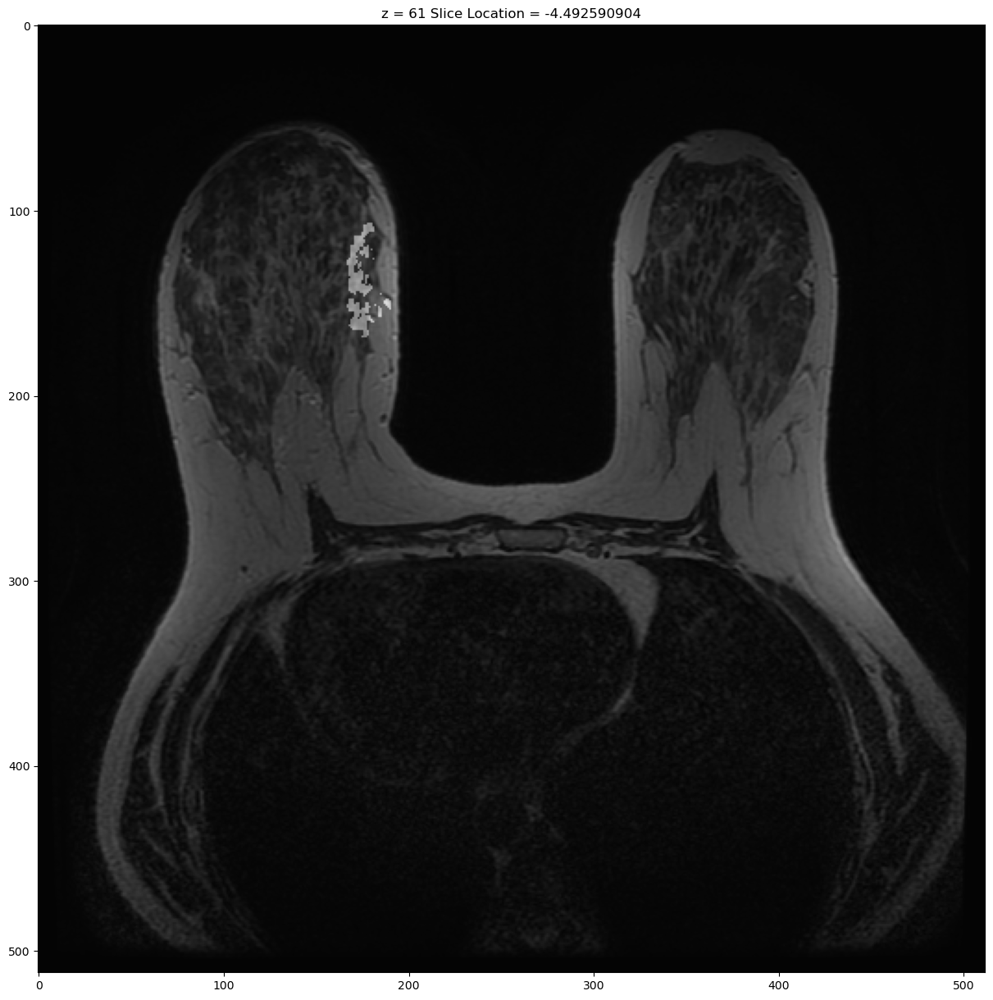

In [44]:
z = 61
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[2]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

## AMBL-626

Expected lesions: R4.40, R12.4

In [45]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-626/12-22-2006-NA-MRI BREASTS - Delayed contrast-30307/600.000000-Registered Ax T2 FSE-43489")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-626/12-22-2006-NA-MRI BREASTS - Delayed contrast-30307/500.000000-ROI-54119/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [46]:
print(rois[0]["z_indexes"]) # R4.40
print(rois[1]["z_indexes"]) # R12.4

[48, 49, 50, 51, 52, 53, 54, 55, 56]
[48, 49, 50]


Text(0.5, 1.0, 'z = 50 Slice Location = 10.4024353')

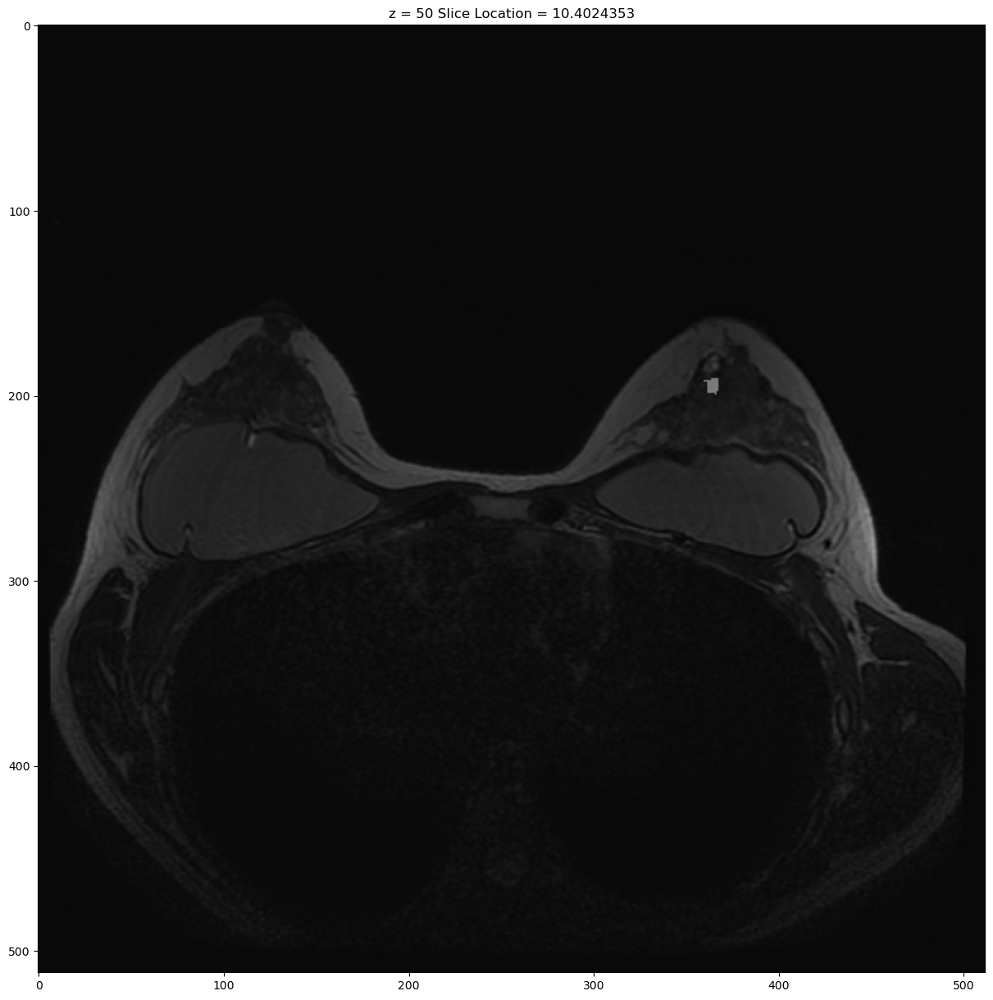

In [47]:
z = 50
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[1]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

## AMBL-631
Expected lesions: L33.93, L25.93. Both are tumor

In [48]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-631/02-21-2007-NA-MRI BREASTS - Delayed contrast-91039/600.000000-Registered Ax T2 FSE-75697")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-631/02-21-2007-NA-MRI BREASTS - Delayed contrast-91039/500.000000-ROI-68853/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [49]:
print(rois[0]["z_indexes"]) # L33.93
print(rois[1]["z_indexes"]) # L25.93

[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 55, 56, 57, 58]
[43, 44, 45, 46, 47, 48]


Text(0.5, 1.0, 'z = 48 Slice Location = 21.92709351')

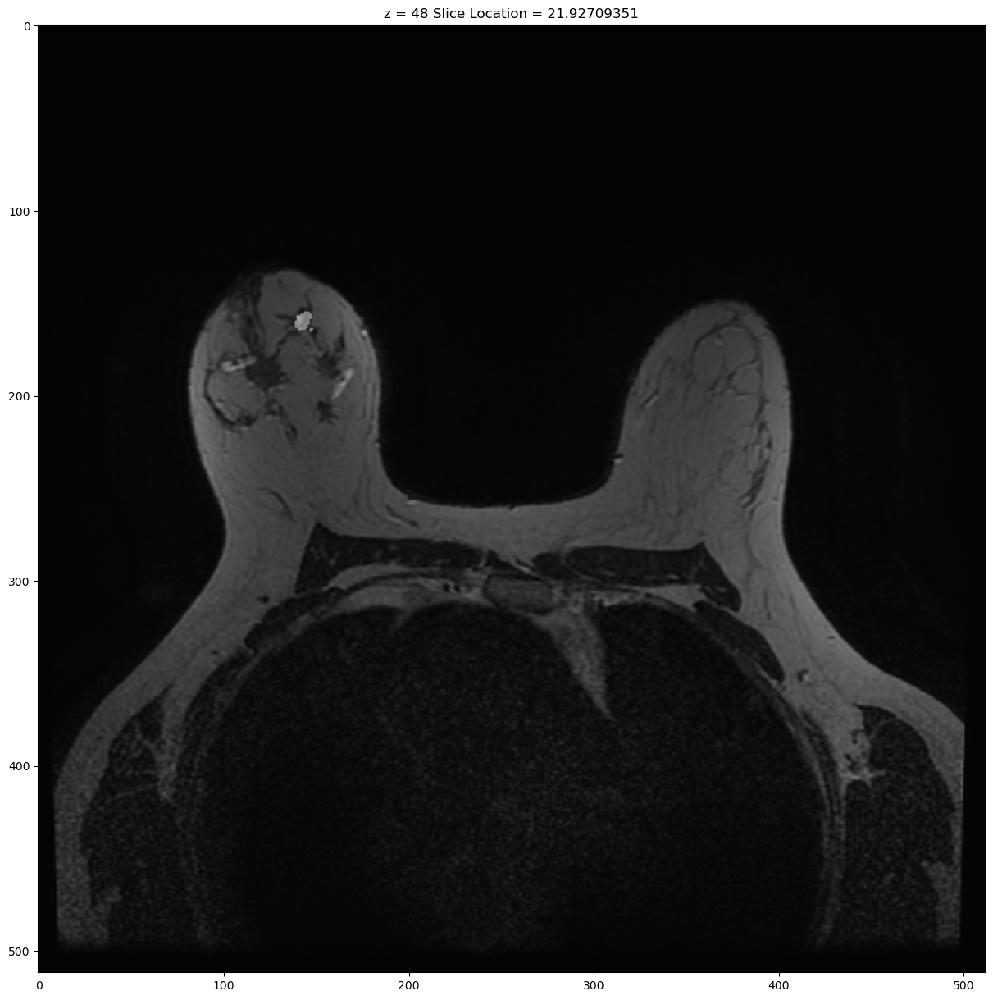

In [50]:
z = 48
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[1]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.4)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

## AMBL-574

Expected the following lesions: L16.76, R-27.24, R-27.4, R-31.24. We can already expect some problems on the right due to the closeness of many lesions. However, all of them are benign, so the assignment doesn't matter

In [51]:
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-574/12-01-2005-NA-MRI BREASTS - Delayed contrast-93585/600.000000-Registered Ax T2 FSE-56269")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-574/12-01-2005-NA-MRI BREASTS - Delayed contrast-93585/500.000000-ROI-73859/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

In [52]:
print(rois[0]["z_indexes"]) # R-27.24
print(rois[1]["z_indexes"]) # R-27.4
print(rois[2]["z_indexes"]) # R-31.24
print(rois[3]["z_indexes"]) # L16.76

[71, 72, 73]
[71, 72, 73]
[73, 74, 75, 76]
[46, 47, 48, 49, 50, 51]


Text(0.5, 1.0, 'z = 73 Slice Location = -29.24365997')

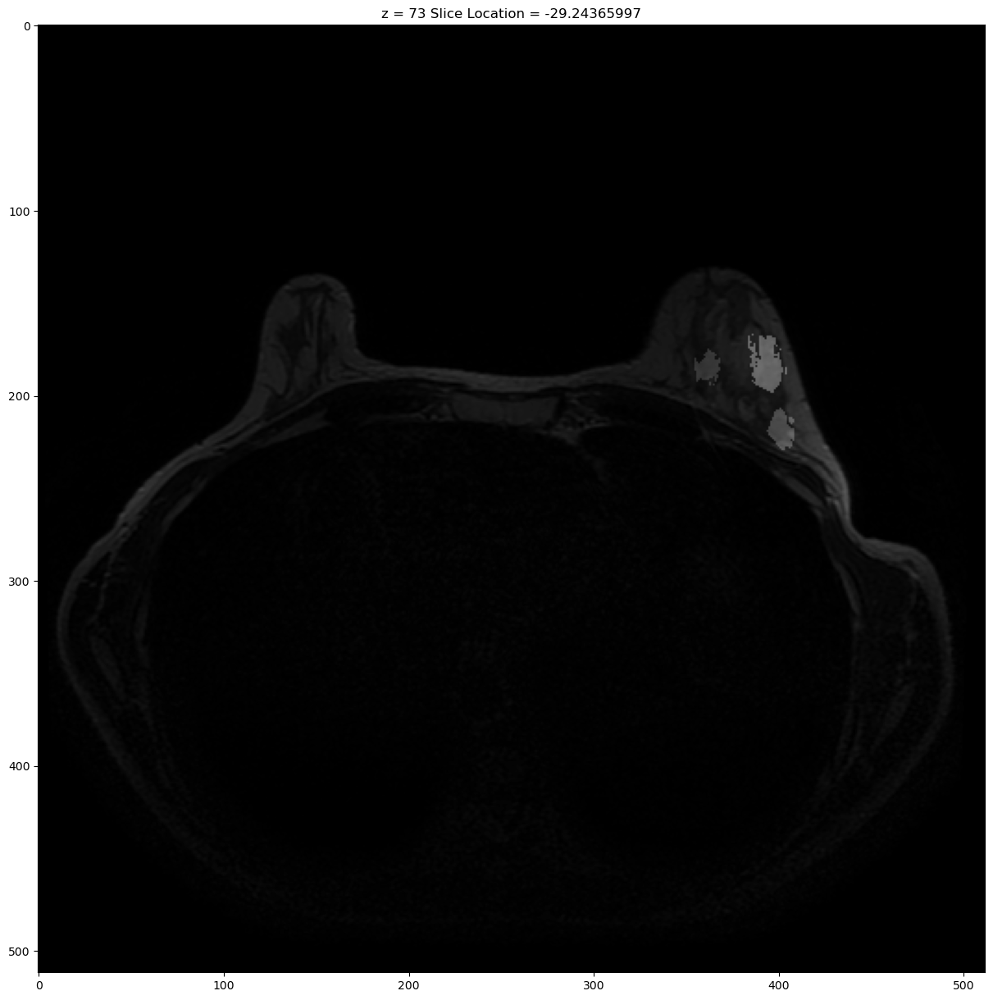

In [53]:
z = 73
plt.figure(figsize = (15,15))
plt.imshow(patient_3d_model[z, :, :], cmap=plt.cm.gray)
plt.imshow(rois[0]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.3)
plt.imshow(rois[1]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.3)
plt.imshow(rois[2]["roi"][z,:,:], cmap=plt.cm.gray, alpha=0.3)
plt.title(f"z = {z} Slice Location = {slices[z].SliceLocation}")

# Output a dataset with both DICOM and ROI files associations

In [7]:
df = pd.read_excel(
    "Advanced-MRI-Breast-Lesions-DA-Clinical-Sep2024.xlsx",
    header = 1,
    index_col = 0
    )
df = df[[
    "tumor/benign1",
    "pos1",
    "tumor/benign2",
    "pos2",
    "tumor/benign3",
    "pos3",
    "tumor/benign4",
    "pos4",
    "tumor/benign5",
    "pos5",
    "tumor/benign6",
    "pos6",
]]
#df.drop(["Unnamed: 2", "Unnamed: 18", "Unnamed: 31", "Unnamed: 44"], axis=1,inplace=True) # dropping empty columns

In [8]:
df

,tumor/benign1,pos1,tumor/benign2,pos2,tumor/benign3,pos3,tumor/benign4,pos4,tumor/benign5,pos5,tumor/benign6,pos6
Patient ID,,,,,,,,,,,,
AMBL-001,1.0,L-60.85,1.0,R-56.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMBL-002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMBL-003,1.0,R-2.76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMBL-004,0.0,L-51.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMBL-005,1.0,R-28.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
AMBL-628,1.0,L12.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
AMBL-629,0.0,L39.93,0.0,R-2.07,0.0,R-20.07,0.0,R1.93,0.0,R-48.07,0.0,R-32.07
AMBL-630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Assign AX T2 FSE and ROI to each patient

In [9]:
# path of directory Advanced MRI Breast Lesions
directory = "/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions"

In [10]:
dcms = []
rois = []

for patient_id in df.index:
    # load the slices and get the 3d shape of the patient
    dcm_path = [roots for roots, dirs, files in os.walk(f"{directory}/{patient_id}") if "Registered Ax T2 FSE" in roots][0]
    dcms.append(dcm_path)
    
    # get the path to the roi file associated with the patient
    roi_path = [roots for roots, dirs, files in os.walk(f"{directory}/{patient_id}") if "ROI" in roots]
    if len(roi_path) != 0:
        roi_path = roi_path[0]
        rois.append(f"{roi_path}/1-1.dcm")
    else:
        rois.append(np.NaN)
        
df["Registered Ax T2 FSE path"] = dcms
df["Roi path"] = rois

In [11]:
df

,tumor/benign1,pos1,tumor/benign2,pos2,tumor/benign3,pos3,tumor/benign4,pos4,tumor/benign5,pos5,tumor/benign6,pos6,Registered Ax T2 FSE path,Roi path
Patient ID,,,,,,,,,,,,,,
AMBL-001,1.0,L-60.85,1.0,R-56.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...
AMBL-002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,NaN
AMBL-003,1.0,R-2.76,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...
AMBL-004,0.0,L-51.98,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...
AMBL-005,1.0,R-28.46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AMBL-628,1.0,L12.81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...
AMBL-629,0.0,L39.93,0.0,R-2.07,0.0,R-20.07,0.0,R1.93,0.0,R-48.07,0.0,R-32.07,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...
AMBL-630,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,/media/bendico765/Crucial X9/MRI Lesions/manif...,NaN


### Create an entry for each dataframe

Anzichè avere per ogni paziente delle colonne hard-codate con le lesioni, creiamo una riga per ciascuna lesione

In [12]:
# for each entry, reformat it by creating a row for each lesion column
l = [
    [
        [
            index,
            1,
            row["tumor/benign1"],
            row["pos1"],
            row["Registered Ax T2 FSE path"],
            row["Roi path"]
        ],
        [
            index,
            2,
            row["tumor/benign2"],
            row["pos2"],
            row["Registered Ax T2 FSE path"],
            row["Roi path"]
        ],
        [
            index,
            3,
            row["tumor/benign3"],
            row["pos3"],
            row["Registered Ax T2 FSE path"],
            row["Roi path"]
        ],
        [
            index,
            4,
            row["tumor/benign4"],
            row["pos4"],
            row["Registered Ax T2 FSE path"],
            row["Roi path"]
        ],
        [
            index,
            5,
            row["tumor/benign5"],
            row["pos5"],
            row["Registered Ax T2 FSE path"],
            row["Roi path"]
        ],
        [
            index,
            6,
            row["tumor/benign6"],
            row["pos6"],
            row["Registered Ax T2 FSE path"],
            row["Roi path"]
        ]
    ]
    for index, row in df.iterrows()
]

l = [ e2 for e1 in l[:] for e2 in e1 ]

In [13]:
lesions_df = pd.DataFrame(
    l,
    columns = ["Patient ID", "lesion idx", "tumor/benign", "pos", "Registered Ax T2 FSE path", "Roi path"]
)

# substitute -1 with nan values
lesions_df["tumor/benign"] = lesions_df["tumor/benign"].replace(-1, np.NaN)
lesions_df["pos"] = lesions_df["pos"].replace(-1, np.NaN)

# subtract -1 from the indexes
lesions_df["lesion idx"] = pd.to_numeric(lesions_df["lesion idx"]) -1 

# drop any row which doesn't have a tumor label, a slice location or a roi path
lesions_df.dropna(subset=["tumor/benign", "pos", "Roi path"], inplace = True) 

# instead of a generic pos, create a column for the slice and one for the position
lesions_df["Slice Location"] = lesions_df["pos"].apply(lambda x: x[1:] if str(x) != "nan" else np.NaN)
lesions_df["Breast"] = lesions_df["pos"].apply(lambda x: x[:1] if str(x) != "nan" else np.NaN)
lesions_df.drop(columns=["pos"], inplace=True)

# cast the slice location column from string to int
lesions_df["Slice Location"] = pd.to_numeric(lesions_df["Slice Location"])

In [14]:
lesions_df

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast
0,AMBL-001,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-60.85,L
1,AMBL-001,1,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-56.85,R
12,AMBL-003,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-2.76,R
18,AMBL-004,0,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.98,L
24,AMBL-005,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-28.46,R
...,...,...,...,...,...,...,...
1180,AMBL-629,4,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-48.07,R
1181,AMBL-629,5,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-32.07,R
1188,AMBL-631,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,33.93,L
1189,AMBL-631,1,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,25.93,L


In [15]:
lesions_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 164 entries, 0 to 1194
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient ID                 164 non-null    object 
 1   lesion idx                 164 non-null    int64  
 2   tumor/benign               164 non-null    float64
 3   Registered Ax T2 FSE path  164 non-null    object 
 4   Roi path                   164 non-null    object 
 5   Slice Location             164 non-null    float64
 6   Breast                     164 non-null    object 
dtypes: float64(2), int64(1), object(4)
memory usage: 10.2+ KB


There **117 lesions** annotated in the excel file which don't have a corresponding ROI file. These rows are dropped.

Of the 164 remaining lesions which have a dicom file, half are benign and half are malign. 

In [16]:
lesions_df["tumor/benign"].value_counts()

tumor/benign
1.0    82
0.0    82
Name: count, dtype: int64

Rimuoviamo dal dataset i pazienti con inconsistenze, in modo da correggerle a mano e reinserirli

In [17]:
inconsistent_patients = [
    "AMBL-572",
    "AMBL-574",
    "AMBL-579",
    "AMBL-590",
    "AMBL-595",
    "AMBL-626",
    "AMBL-629",
    "AMBL-631"
]

In [18]:
inconsistent_df = lesions_df[lesions_df["Patient ID"].isin(inconsistent_patients)].copy()
inconsistent_df

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast
834,AMBL-572,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,R
835,AMBL-572,1,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-21.00,L
836,AMBL-572,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.00,R
837,AMBL-572,3,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,L
838,AMBL-572,4,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.00,L
846,AMBL-574,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,16.76,L
847,AMBL-574,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.24,R
848,AMBL-574,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.40,R
849,AMBL-574,3,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-31.24,R
876,AMBL-579,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-42.57,R


In [19]:
# remove the incosistences from the dataset
lesions_df = lesions_df[~ lesions_df["Patient ID"].isin(inconsistent_patients)].copy()
lesions_df

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast
0,AMBL-001,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-60.85,L
1,AMBL-001,1,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-56.85,R
12,AMBL-003,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-2.76,R
18,AMBL-004,0,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.98,L
24,AMBL-005,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-28.46,R
...,...,...,...,...,...,...,...
1164,AMBL-627,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-48.17,L
1165,AMBL-627,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,35.83,R
1166,AMBL-627,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-36.17,R
1170,AMBL-628,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,12.81,L


### To each lesion associate the corrisponding pixel data

In [20]:
lesion_pixel_array = []
z_indexes = []
y_indexes = []
x_indexes = []
z_offset_array = []
y_offset_array = []
x_offset_array = []

for _, row in lesions_df.iterrows():  
    if pd.isnull(row["Roi path"]):
        lesion_pixel_array.append(np.NaN)
        z_indexes.append(np.NaN)
        y_indexes.append(np.NaN)
        x_indexes.append(np.NaN)
        z_offset_array.append(np.NaN)
        y_offset_array.append(np.NaN)
        x_offset_array.append(np.NaN)
        continue
        
    if row["lesion idx"] == 0: # if it is the firt lesion of the patient, open up the dicom files of MRI and ROI
        patient_slices = read_dicomdir(row["Registered Ax T2 FSE path"])
        patient_3d_model = get_3d_shape(patient_slices)
        slices_per_file = patient_3d_model.shape[0]
        slice_thickness = patient_slices[0].SliceThickness
        
        roi = pydicom.dcmread(row["Roi path"])
        rois = read_3d_rois(roi, slices_per_file)

    candidate_rois = []
    
    # check for each lesion if it is localized on the left of right side
    mean = lambda l: sum(l)/len(l) if len(l) != 0 else 0    
    for roi in rois: 
        side = row["Breast"]
        if mean(roi["x_indexes"]) < 256: # closer to the left part of the image
            if side == "L":
                candidate_rois.append(roi)
        else:
            if side == "R":
                candidate_rois.append(roi)
    
    if( len(candidate_rois) == 0 ):
        print(f'[{row["Patient ID"]}] [{row["Breast"]}] [{row["Slice Location"]}] No candidate ROI')
        lesion_pixel_array.append(np.NaN)
        z_indexes.append(np.NaN)
        y_indexes.append(np.NaN)
        x_indexes.append(np.NaN)
        z_offset_array.append(np.NaN)
        y_offset_array.append(np.NaN)
        x_offset_array.append(np.NaN)
        continue
    
    if( len(candidate_rois) > 1 ):
        picked_roi = False
        for roi in candidate_rois:
            min_z = min(roi["z_indexes"])
            max_z = max(roi["z_indexes"])
            
            max_slice = max(patient_slices[min_z].SliceLocation, patient_slices[max_z].SliceLocation)
            min_slice = min(patient_slices[min_z].SliceLocation, patient_slices[max_z].SliceLocation)
            
            if min_slice <= row["Slice Location"] <= max_slice or (abs(row["Slice Location"] - max_slice) <= slice_thickness or abs(row["Slice Location"] - min_slice) <= slice_thickness):
                lesion_pixel_array.append(roi["roi"])
                z_indexes.append(roi["z_indexes"])
                y_indexes.append(roi["y_indexes"])
                x_indexes.append(roi["x_indexes"])
                
                z_offset, y_offset, x_offset = get_roi_size(roi)
                z_offset_array.append(z_offset)
                y_offset_array.append(y_offset)
                x_offset_array.append(x_offset)
                
                picked_roi = True
                break
        
        if picked_roi == False:
            raise Exception(f'[{row["Patient ID"]}] [{row["Breast"]}] [{row["Slice Location"]}] Impossible to pick a ROI')
    else:
        lesion_pixel_array.append(candidate_rois[0]["roi"])
        z_indexes.append(candidate_rois[0]["z_indexes"])
        y_indexes.append(candidate_rois[0]["y_indexes"])
        x_indexes.append(candidate_rois[0]["x_indexes"])
        
        z_offset, y_offset, x_offset = get_roi_size(candidate_rois[0])
        z_offset_array.append(z_offset)
        y_offset_array.append(y_offset)
        x_offset_array.append(x_offset)

lesions_df["Pixel array"] = lesion_pixel_array
lesions_df["z_indexes"] = z_indexes
lesions_df["y_indexes"] = y_indexes
lesions_df["x_indexes"] = x_indexes
lesions_df["z_offset"] = z_offset_array
lesions_df["y_offset"] = y_offset_array
lesions_df["x_offset"] = x_offset_array

### Manually fix the inconsistencies

In [21]:
inconsistent_df["Pixel array"] = None
inconsistent_df["z_indexes"] = None
inconsistent_df["y_indexes"] = None
inconsistent_df["x_indexes"] = None
inconsistent_df["z_offset"] = 0
inconsistent_df["y_offset"] = 0
inconsistent_df["x_offset"] = 0

In [22]:
inconsistent_df

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast,Pixel array,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset
834,AMBL-572,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,R,None,None,None,None,0,0,0
835,AMBL-572,1,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-21.00,L,None,None,None,None,0,0,0
836,AMBL-572,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.00,R,None,None,None,None,0,0,0
837,AMBL-572,3,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,L,None,None,None,None,0,0,0
838,AMBL-572,4,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.00,L,None,None,None,None,0,0,0
846,AMBL-574,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,16.76,L,None,None,None,None,0,0,0
847,AMBL-574,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.24,R,None,None,None,None,0,0,0
848,AMBL-574,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.40,R,None,None,None,None,0,0,0
849,AMBL-574,3,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-31.24,R,None,None,None,None,0,0,0
876,AMBL-579,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-42.57,R,None,None,None,None,0,0,0


In [23]:
def assign_roi_to_entry(index: int, roi: dict):
    inconsistent_df.at[index, "Pixel array"] = roi["roi"]
    inconsistent_df.at[index, "z_indexes"] = roi["z_indexes"]
    inconsistent_df.at[index, "y_indexes"] = roi["y_indexes"]
    inconsistent_df.at[index, "x_indexes"] = roi["x_indexes"]
    inconsistent_df.at[index, "z_offset"],inconsistent_df.at[index, "y_offset"],inconsistent_df.at[index, "x_offset"]   = get_roi_size(roi)

# AMBL-572
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-572/11-25-2005-NA-MRI BREASTS - Delayed contrast-51529/600.000000-Registered Ax T2 FSE-43029")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-572/11-25-2005-NA-MRI BREASTS - Delayed contrast-51529/500.000000-ROI-99161/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(834, rois[3]) # R-11
assign_roi_to_entry(835, rois[4]) # L-21
assign_roi_to_entry(836, rois[0]) # R-51
assign_roi_to_entry(837, rois[1]) # L-11
assign_roi_to_entry(838, rois[2]) # L-27

# AMBL-574
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-574/12-01-2005-NA-MRI BREASTS - Delayed contrast-93585/600.000000-Registered Ax T2 FSE-56269")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-574/12-01-2005-NA-MRI BREASTS - Delayed contrast-93585/500.000000-ROI-73859/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(846, rois[3]) # L16.76
assign_roi_to_entry(847, rois[0]) # R-27.24
assign_roi_to_entry(848, rois[1]) # R-27.4
assign_roi_to_entry(849, rois[2]) # R-31.24

# AMBL-579
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-579/12-21-2005-NA-MRI BREASTS - Delayed contrast-84296/600.000000-Registered Ax T2 FSE-17158")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-579/12-21-2005-NA-MRI BREASTS - Delayed contrast-84296/500.000000-ROI-89400/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(876, rois[1]) # R-40.57
assign_roi_to_entry(877, rois[0]) # R-42.57

# AMBL-590
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-590/02-08-2006-NA-MRI BREASTS - Delayed contrast-70942/600.000000-Registered Ax T2 FSE-54767")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-590/02-08-2006-NA-MRI BREASTS - Delayed contrast-70942/500.000000-ROI-91209/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(942, rois[3]) # L37.31
assign_roi_to_entry(943, rois[4]) # L-13.27
assign_roi_to_entry(944, rois[0]) # R-22.09
assign_roi_to_entry(945, rois[1]) # R-24.29
assign_roi_to_entry(946, rois[2]) # L7.71

# AMBL-595
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-595/04-12-2006-NA-MRI BREASTS - Delayed contrast-99337/600.000000-Registered Ax T2 FSE-16358")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-595/04-12-2006-NA-MRI BREASTS - Delayed contrast-99337/500.000000-ROI-96750/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(972, rois[0]) # L22.86
assign_roi_to_entry(973, rois[1]) # L-45.34
# change rois 1 breast label from right to left
inconsistent_df.at[973, "Breast"] = "L"
    
# AMBL-626
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-626/12-22-2006-NA-MRI BREASTS - Delayed contrast-30307/600.000000-Registered Ax T2 FSE-43489")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-626/12-22-2006-NA-MRI BREASTS - Delayed contrast-30307/500.000000-ROI-54119/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(1158, rois[0]) # R4.40
assign_roi_to_entry(1159, rois[1]) # R12.4

# AMBL-629
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-629/01-30-2007-NA-MRI BREASTS - Delayed contrast-40670/600.000000-Registered Ax T2 FSE-05708")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-629/01-30-2007-NA-MRI BREASTS - Delayed contrast-40670/500.000000-ROI-75632/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(1176, rois[0]) # L39.93
assign_roi_to_entry(1177, rois[1]) # R-2.07
assign_roi_to_entry(1178, rois[2]) # R-20.07
assign_roi_to_entry(1179, rois[3]) # R1.93
assign_roi_to_entry(1180, rois[4]) # R-48.07
assign_roi_to_entry(1181, rois[5]) # R-32.07

# AMBL-631
slices = read_dicomdir("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-631/02-21-2007-NA-MRI BREASTS - Delayed contrast-91039/600.000000-Registered Ax T2 FSE-75697")
patient_3d_model = get_3d_shape(slices)
slices_per_file = patient_3d_model.shape[0]

roi = pydicom.dcmread("/media/bendico765/Crucial X9/MRI Lesions/manifest-1728494830954/Advanced-MRI-Breast-Lesions/AMBL-631/02-21-2007-NA-MRI BREASTS - Delayed contrast-91039/500.000000-ROI-68853/1-1.dcm")
rois = read_3d_rois(roi, slices_per_file)

assign_roi_to_entry(1188, rois[0]) # L33.93
assign_roi_to_entry(1189, rois[1]) # L25.93

In [24]:
inconsistent_df

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast,Pixel array,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset
834,AMBL-572,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[60, 61, 62, 63]","[191, 192, 193, 194, 195, 196, 197, 198, 199, ...","[330, 331, 332, 333, 334, 335, 336, 337, 338, ...",4,17,14
835,AMBL-572,1,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-21.00,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[65, 66, 67]","[193, 194, 195, 196, 197, 198, 199, 200, 201, ...","[121, 122, 123, 124, 125, 126, 127, 128]",3,11,8
836,AMBL-572,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.00,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[77, 78, 79, 80, 81, 82, 83, 84, 85]","[162, 163, 164, 165, 166, 167, 168, 169, 170, ...","[355, 356, 357, 358, 359, 360, 361, 362, 363, ...",9,58,49
837,AMBL-572,3,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[59, 60, 61]","[179, 180, 181, 182, 183, 184, 185, 186, 187, ...","[164, 165, 166, 167, 168, 169, 170, 171, 172, ...",3,11,12
838,AMBL-572,4,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.00,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[67, 68, 69]","[148, 149, 150, 151, 152, 153, 154, 155, 156, ...","[173, 174, 175, 176, 177, 178, 179, 180, 181]",3,18,9
846,AMBL-574,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,16.76,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[46, 47, 48, 49, 50, 51]","[150, 151, 152, 153, 154, 155, 156, 157, 158, ...","[121, 122, 123, 124, 125, 126, 127, 128, 129, ...",6,56,52
847,AMBL-574,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.24,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[71, 72, 73]","[175, 176, 177, 178, 179, 180, 181, 182, 183, ...","[351, 352, 353, 354, 355, 356, 357, 358, 359, ...",3,20,18
848,AMBL-574,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-27.40,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[71, 72, 73]","[207, 208, 209, 210, 211, 212, 213, 214, 215, ...","[390, 391, 392, 393, 394, 395, 396, 397, 398, ...",3,23,20
849,AMBL-574,3,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-31.24,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[73, 74, 75, 76]","[167, 168, 169, 170, 171, 172, 173, 174, 175, ...","[373, 374, 375, 376, 377, 378, 379, 380, 381, ...",4,38,33
876,AMBL-579,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-42.57,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]","[169, 170, 171, 172, 173, 174, 175, 176, 177, ...","[372, 373, 374, 375, 376, 377, 378, 379, 380, ...",11,104,45


In [25]:
# combine the dataframes together
lesions_df = pd.concat([lesions_df, inconsistent_df])

In [26]:
del inconsistent_df
del df
del lesion_pixel_array
del slices
del rois
del patient_3d_model

### Check the presence of duplicates 

To check the presence of duplicates we use the axis-offset as proxy: first we get all the lesions with the same size, then it is checked that they are not the exact same lesion.

In [26]:
duplicated_df = lesions_df[lesions_df.duplicated(subset=["z_offset", "y_offset", "x_offset"], keep=False)]

In [27]:
duplicated_df.sort_values(by=["z_offset", "y_offset", "x_offset"])

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast,Pixel array,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset
1052,AMBL-608,2,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,4.01,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[53, 54]","[88, 89, 90, 91, 92]","[338, 339, 340, 341]",2,5,4
1123,AMBL-620,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,19.34,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[61, 62]","[113, 114, 115, 116, 117]","[362, 363, 364, 365]",2,5,4
61,AMBL-011,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-32.84,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[71, 72]","[139, 140, 141, 142, 143, 144, 145, 146, 147, ...","[384, 385, 386, 387, 388, 389, 390, 391, 392]",2,10,9
781,AMBL-563,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,7.04,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[59, 60]","[204, 205, 206, 207, 208, 209, 210, 211, 212, ...","[361, 362, 363, 364, 365, 366, 367, 368, 369]",2,10,9
132,AMBL-023,0,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-14.63,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[63, 64, 65]","[202, 203, 204, 205, 206, 207, 208, 209, 210, ...","[101, 102, 103, 104, 105, 106, 107]",3,11,7
133,AMBL-023,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-58.73,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[84, 85, 86]","[215, 216, 217, 218, 219, 220, 221, 222, 223, ...","[398, 399, 400, 401, 402, 403, 404]",3,11,7
288,AMBL-049,0,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,13.80,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[48, 49, 50, 51]","[185, 186, 187, 188, 189, 190, 191, 192, 193, ...","[177, 178, 179, 180, 181, 182, 183, 184, 185, ...",4,14,10
810,AMBL-568,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,9.96,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[58, 59, 60, 61]","[194, 195, 196, 197, 198, 199, 200, 201, 202, ...","[346, 347, 348, 349, 350, 351, 352, 353, 354, ...",4,14,10
871,AMBL-578,1,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-42.57,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[75, 76, 77, 78]","[142, 143, 144, 145, 146, 147, 148, 149, 150, ...","[121, 122, 123, 124, 125, 126, 127, 128, 129, ...",4,17,14
834,AMBL-572,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-11.00,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[60, 61, 62, 63]","[191, 192, 193, 194, 195, 196, 197, 198, 199, ...","[330, 331, 332, 333, 334, 335, 336, 337, 338, ...",4,17,14


In [28]:
len(lesions_df)

164

In [29]:
lesions_df["tumor/benign"].value_counts()

tumor/benign
1.0    82
0.0    82
Name: count, dtype: int64

Finally, there are 164 lesions with a ROI associated. Half of them are malign and the other half are benign.

### Export the dataset

In [27]:
path = "/media/bendico765/Crucial X9/MRI Lesions"
folder_name = "Roi masks"

# create the directory for the numpy files
try:
    os.mkdir(f"{path}/{folder_name}")
except FileExistsError:
    pass

# save the numpy 3d models inside the folder
numpy_filepaths_array = []
for patient_id in lesions_df["Patient ID"].unique():
    # create the patient rois folder
    try:
        os.mkdir(f"{path}/{folder_name}/{patient_id}")
    except FileExistsError:
        pass

    # for each patient lesion, save it
    for index, (_, row) in enumerate(lesions_df[lesions_df["Patient ID"] == patient_id].iterrows()):
        # save the roi
        pixel_array = row["Pixel array"]
        numpy_filepath = f"{path}/{folder_name}/{patient_id}/ROI {index}.npy"
        np.save(numpy_filepath, pixel_array)
        numpy_filepaths_array.append(numpy_filepath)

with open(f"{path}/{folder_name}/README.txt", "w") as file:
    file.write("Maschere ROI in formato npy")

lesions_df["Roi mask Filepath"] = numpy_filepaths_array

In [28]:
lesions_df[["Patient ID", "tumor/benign", "Registered Ax T2 FSE path", "Slice Location", "Breast", "z_indexes", "y_indexes", "x_indexes", "z_offset", "y_offset", "x_offset", "Roi mask Filepath"]].to_csv("/media/bendico765/Crucial X9/MRI Lesions/lesions_df.csv")

# Checking lesions size

In [4]:
lesions_df = pd.read_csv("/media/bendico765/Crucial X9/MRI Lesions/lesions_df.csv", index_col=0)

lesions_df["z_indexes"] = lesions_df["z_indexes"].apply(ast.literal_eval)
lesions_df["y_indexes"] = lesions_df["y_indexes"].apply(ast.literal_eval)
lesions_df["x_indexes"] = lesions_df["x_indexes"].apply(ast.literal_eval)

In [40]:
lesions_df

,Patient ID,tumor/benign,Registered Ax T2 FSE path,Slice Location,Breast,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset,Roi mask Filepath
0,AMBL-001,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-60.85,L,"[82, 83, 84, 85, 86, 87]","[172, 173, 174, 175, 176, 177, 178, 179, 180, ...","[142, 143, 144, 145, 146, 147, 148, 149, 150, ...",6,42,23,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
1,AMBL-001,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-56.85,R,"[82, 83, 84, 85]","[188, 189, 190, 191, 192, 193, 194, 195, 196, ...","[360, 361, 362, 363, 364, 365, 366, 367, 368, ...",4,46,17,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
12,AMBL-003,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-2.76,R,"[49, 50, 51, 52, 53, 54, 55]","[178, 179, 180, 181, 182, 183, 184, 185, 186, ...","[357, 358, 359, 360, 361, 362, 363, 364, 365, ...",7,40,21,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
18,AMBL-004,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.98,L,"[81, 82, 83, 84, 85]","[163, 164, 165, 166, 167, 168, 169, 170, 171, ...","[147, 148, 149, 150, 151, 152, 153, 154, 155, ...",5,18,13,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
24,AMBL-005,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-28.46,R,"[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 6...","[194, 195, 196, 197, 198, 199, 200, 201, 202, ...","[379, 380, 381, 382, 383, 384, 385, 386, 387, ...",13,55,47,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
...,...,...,...,...,...,...,...,...,...,...,...,...
1179,AMBL-629,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,1.93,R,"[55, 56, 57]","[159, 160, 161, 162, 163, 164, 165, 166, 167, ...","[391, 392, 393, 394, 395, 396, 397, 398, 399, ...",3,21,10,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
1180,AMBL-629,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-48.07,R,"[81, 82]","[147, 148, 149, 150, 151, 152, 153, 154, 155, ...","[373, 374, 375, 376, 377, 378, 379, 380, 381, ...",2,17,14,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
1181,AMBL-629,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-32.07,R,"[73, 74, 75]","[156, 157, 158, 159, 160, 161, 162, 163, 164, ...","[338, 339, 340, 341, 342, 343, 344, 345, 346, ...",3,20,12,/media/bendico765/Crucial X9/MRI Lesions/Roi m...
1188,AMBL-631,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,33.93,L,"[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 4...","[143, 144, 145, 146, 147, 148, 149, 150, 151, ...","[99, 100, 101, 102, 103, 104, 105, 106, 107, 1...",22,85,87,/media/bendico765/Crucial X9/MRI Lesions/Roi m...


## Offset

For each lesion, compute the offset on the z, y and x axeses.

In [46]:
lesions_df[["Patient ID", "tumor/benign", "z_offset", "y_offset", "x_offset"]]

,Patient ID,tumor/benign,z_offset,y_offset,x_offset
0,AMBL-001,1.0,6,42,23
1,AMBL-001,1.0,4,46,17
12,AMBL-003,1.0,7,40,21
18,AMBL-004,0.0,5,18,13
24,AMBL-005,1.0,13,55,47
...,...,...,...,...,...
1179,AMBL-629,0.0,3,21,10
1180,AMBL-629,0.0,2,17,14
1181,AMBL-629,0.0,3,20,12
1188,AMBL-631,1.0,22,85,87


In [47]:
lesions_df[["z_offset", "y_offset", "x_offset"]].describe()

,z_offset,y_offset,x_offset
count,164.000000,164.000000,164.000000
mean,7.993902,41.250000,28.286585
std,5.792418,32.296627,19.929866
min,1.000000,3.000000,4.000000
25%,4.000000,18.000000,13.000000
50%,6.000000,27.500000,23.000000
75%,11.000000,56.500000,38.250000
max,31.000000,147.000000,97.000000


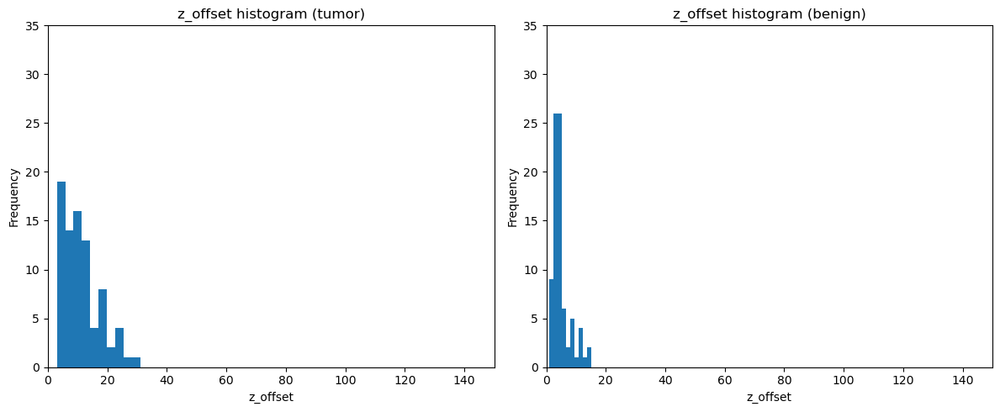

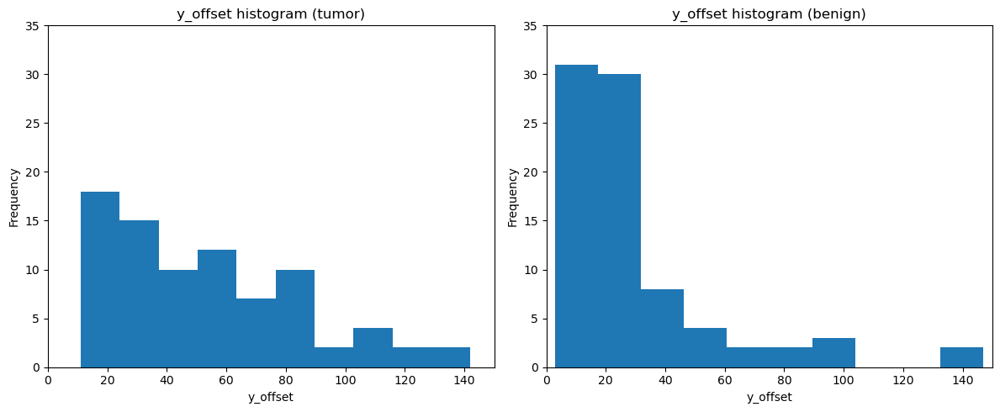

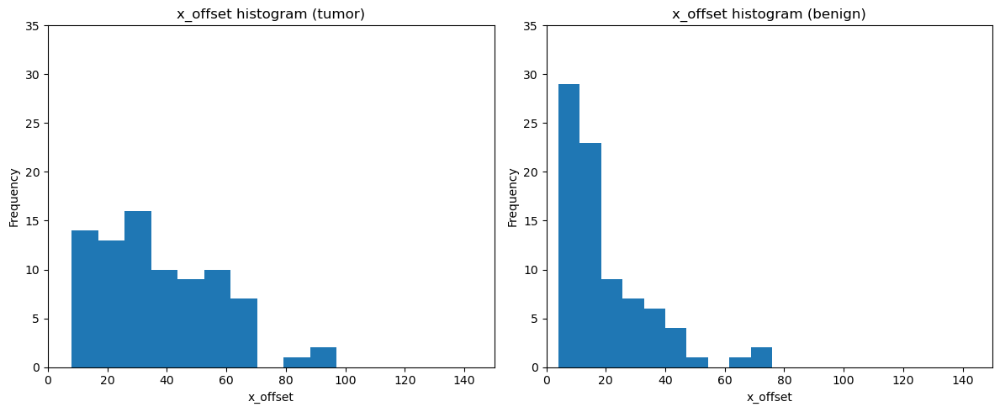

In [48]:
for label in ["z_offset", "y_offset", "x_offset"]:    
    fig, axes = plt.subplots(1,2, figsize=(12,5)) # 1 row, 2 columns
    
    # plot first graph (tumor)
    axes[0].set_title(f'{label} histogram (tumor)')
    axes[0].set_xlabel(label)
    axes[0].set_xlim([0, 150])
    axes[0].set_ylabel("Frequency")
    axes[0].set_ylim([0, 35])
    axes[0].hist(lesions_df[lesions_df["tumor/benign"] == 1 ][label])
    
    # plot first graph (benign)
    axes[1].set_title(f'{label} histogram (benign)')
    axes[1].set_xlabel(label)
    axes[1].set_xlim([0, 150])
    axes[1].set_ylabel("Frequency")
    axes[1].set_ylim([0, 35])
    axes[1].hist(lesions_df[lesions_df["tumor/benign"] == 0 ][label])
    
    plt.tight_layout()
    #plt.show()
    plt.savefig(f'/home/bendico765/Scrivania/{label}_plot.png')

### Exploring the extremes

#### z axis

##### tumor

In [32]:
top3_z_tumor_df = lesions_df[lesions_df["tumor/benign"] == 1].sort_values(by="z_offset", ascending=False)[:3]
top3_z_tumor_df[["Patient ID", "Registered Ax T2 FSE path", "Slice Location", "Breast", "z_offset", "z_indexes"]]

,Patient ID,Registered Ax T2 FSE path,Slice Location,Breast,z_offset,z_indexes
708,AMBL-496,/media/bendico765/Crucial X9/MRI Lesions/manif...,-15.98,L,31,"[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 6..."
774,AMBL-562,/media/bendico765/Crucial X9/MRI Lesions/manif...,-45.83,R,28,"[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 7..."
924,AMBL-587,/media/bendico765/Crucial X9/MRI Lesions/manif...,19.88,L,25,"[44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 5..."


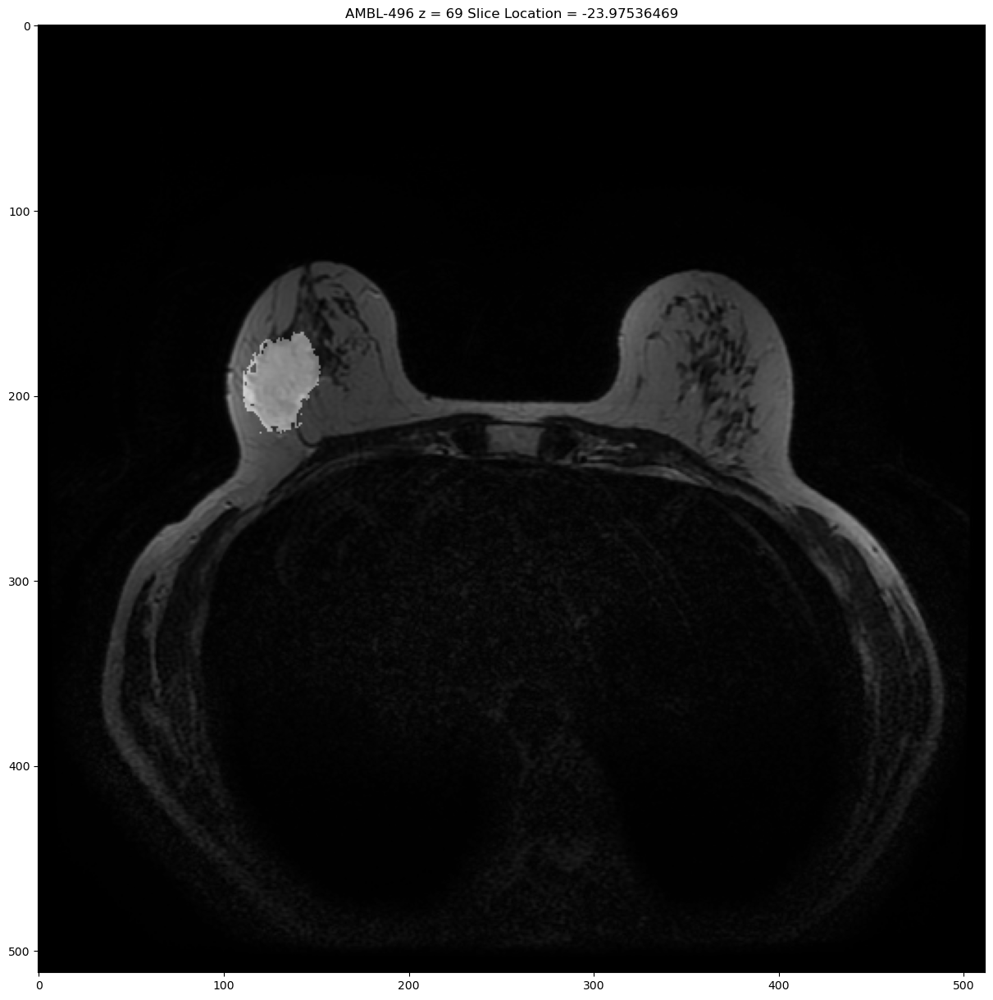

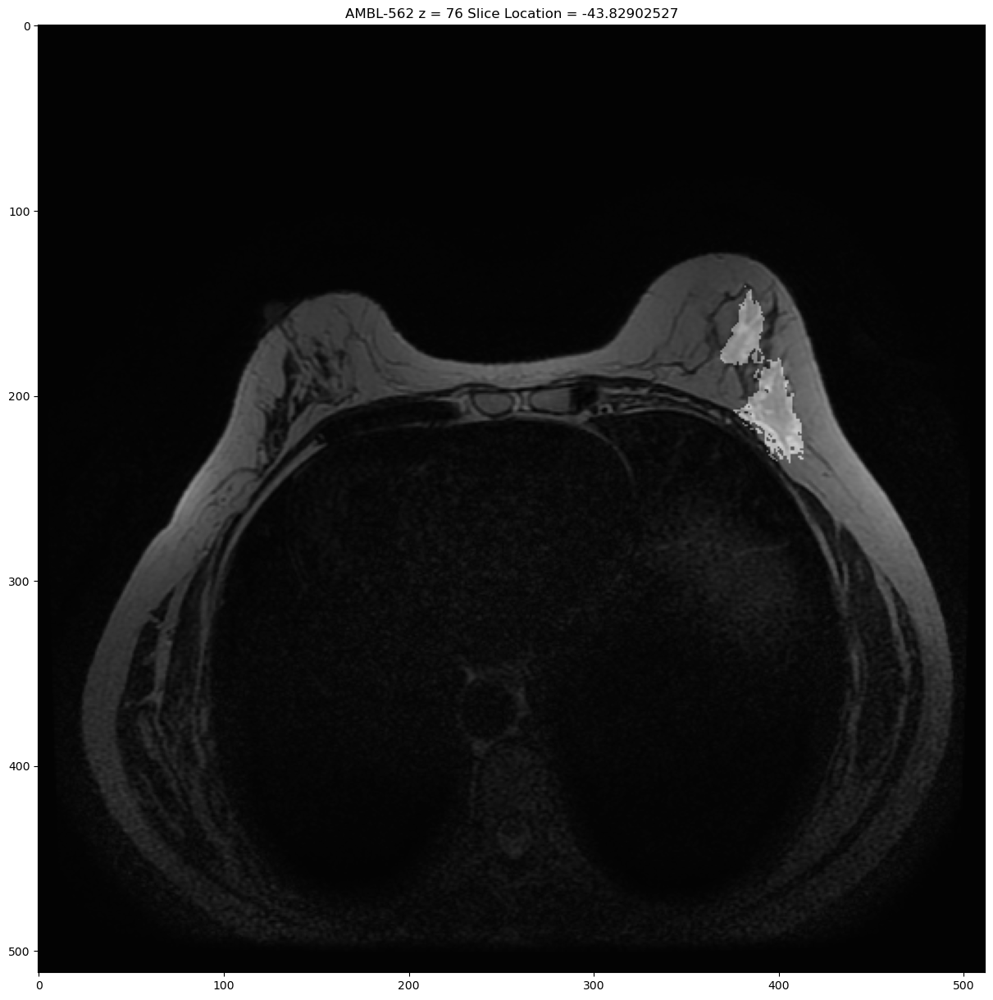

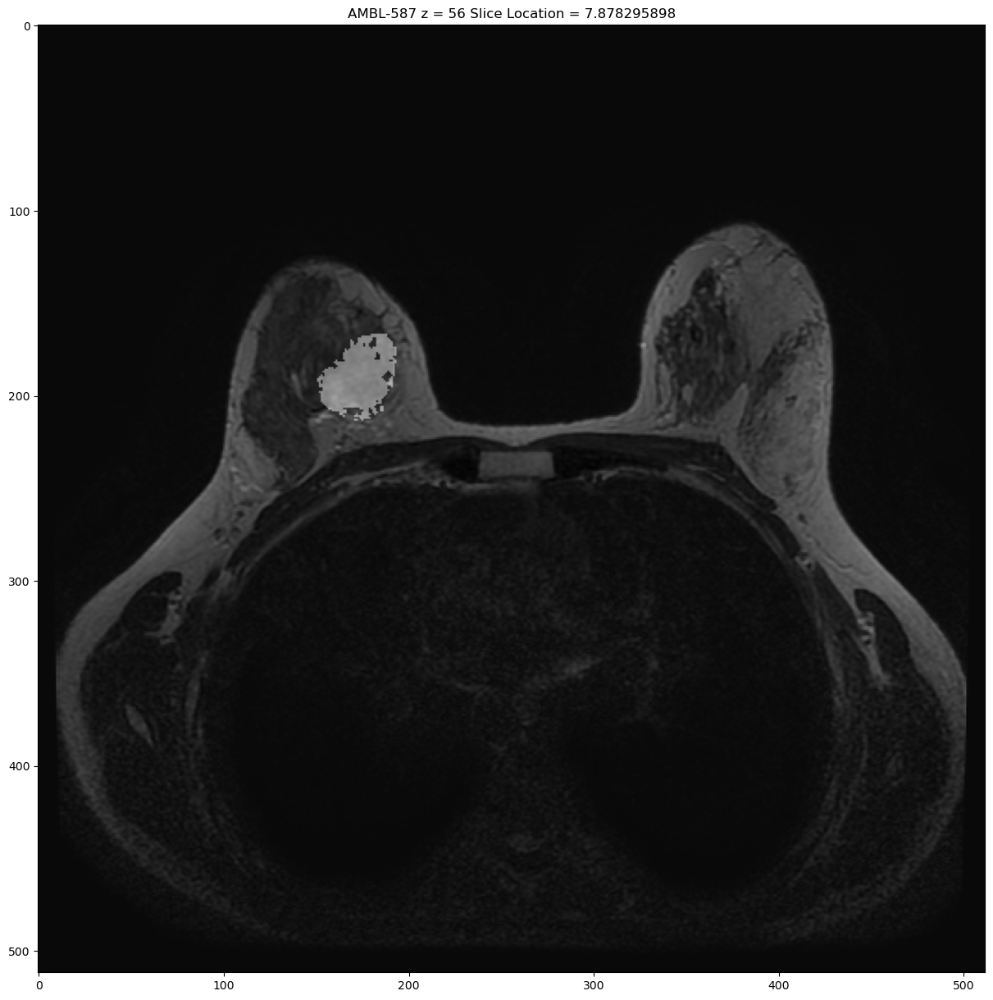

In [33]:
for _, row in top3_z_tumor_df.iterrows():
    slices = read_dicomdir(row["Registered Ax T2 FSE path"])
    model_3d = get_3d_shape(slices)
    
    roi = row["Pixel array"]
    z = int(np.median(row["z_indexes"]))
    plt.figure(figsize = (15,15))
    plt.imshow(model_3d[z, :, :], cmap=plt.cm.gray)
    plt.imshow(roi[z,:,:], cmap=plt.cm.gray, alpha=0.4)
    plt.title(f'{row["Patient ID"]} z = {z} Slice Location = {slices[z].SliceLocation}')

##### benign

In [34]:
top3_z_benign_df = lesions_df[lesions_df["tumor/benign"] == 0].sort_values(by="z_offset", ascending=False)[:3]
top3_z_benign_df[["Patient ID", "Registered Ax T2 FSE path", "Slice Location", "Breast", "z_offset", "z_indexes"]]

,Patient ID,Registered Ax T2 FSE path,Slice Location,Breast,z_offset,z_indexes
946,AMBL-590,/media/bendico765/Crucial X9/MRI Lesions/manif...,8.71,L,15,"[47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 5..."
144,AMBL-025,/media/bendico765/Crucial X9/MRI Lesions/manif...,34.66,R,15,"[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 5..."
967,AMBL-594,/media/bendico765/Crucial X9/MRI Lesions/manif...,1.23,R,13,"[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 6..."


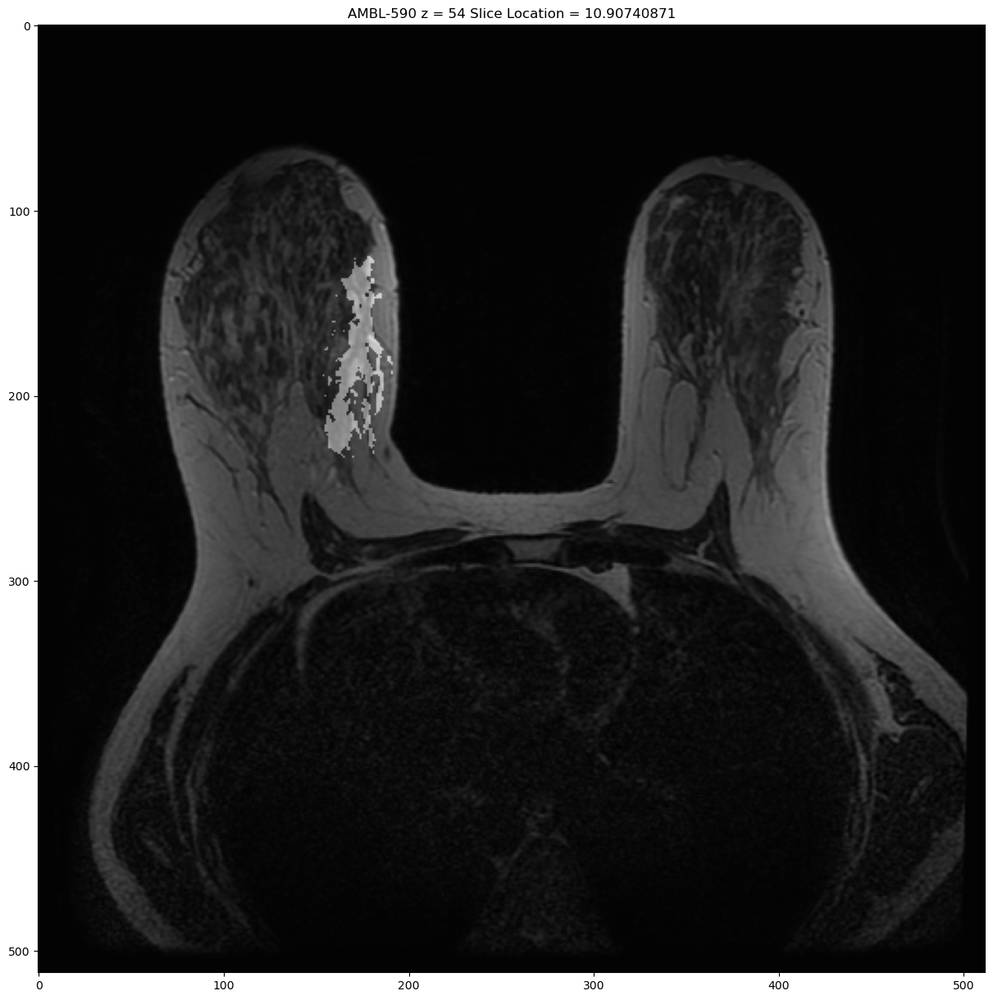

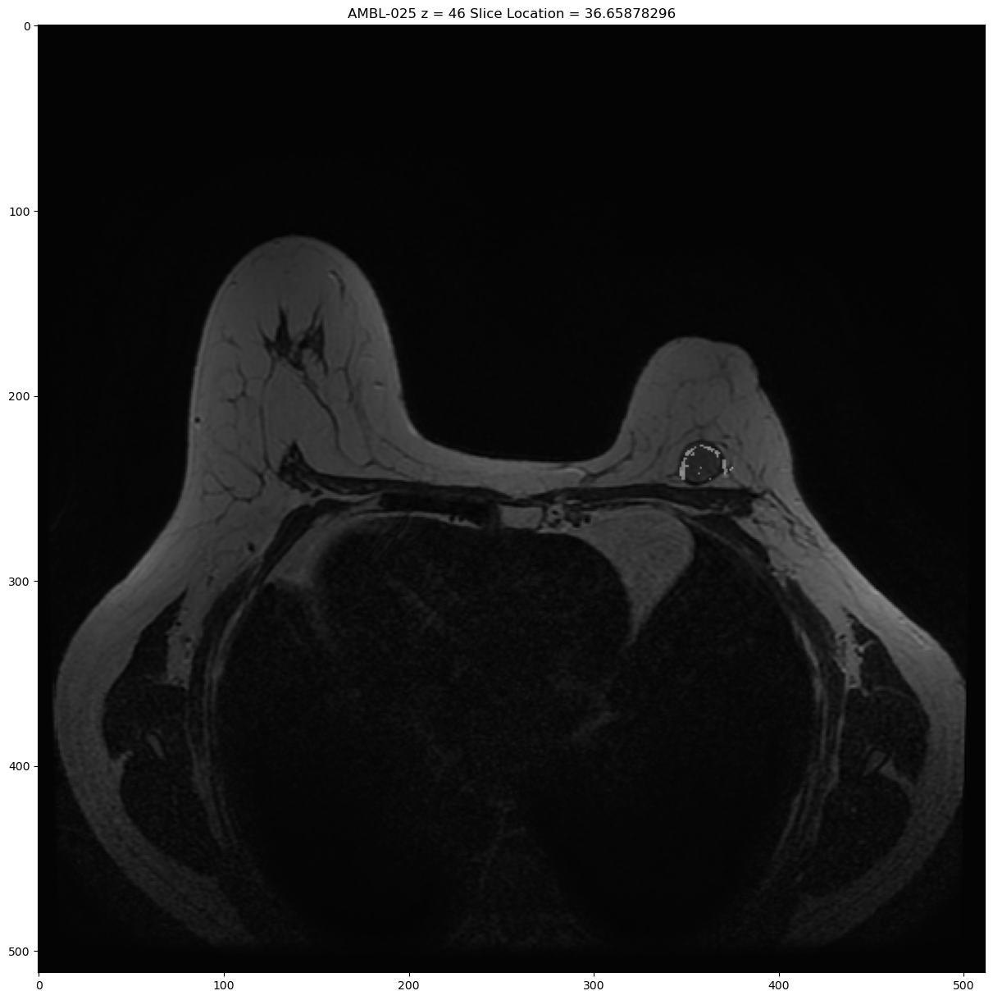

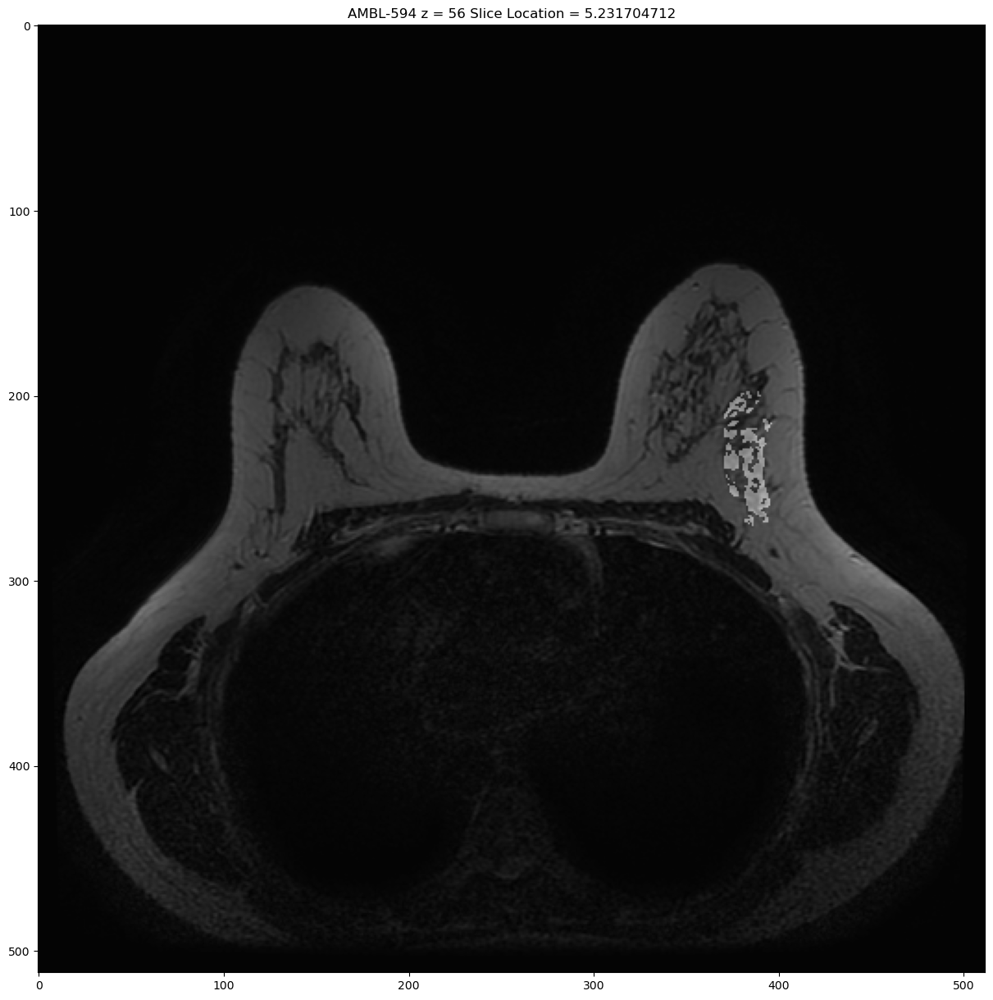

In [35]:
for _, row in top3_z_benign_df.iterrows():
    slices = read_dicomdir(row["Registered Ax T2 FSE path"])
    model_3d = get_3d_shape(slices)
    
    roi = row["Pixel array"]
    z = int(np.median(row["z_indexes"]))
    plt.figure(figsize = (15,15))
    plt.imshow(model_3d[z, :, :], cmap=plt.cm.gray)
    plt.imshow(roi[z,:,:], cmap=plt.cm.gray, alpha=0.4)
    plt.title(f'{row["Patient ID"]} z = {z} Slice Location = {slices[z].SliceLocation}')

#### y axis

##### tumor

In [36]:
top3_y_tumor_df = lesions_df[lesions_df["tumor/benign"] == 1].sort_values(by="y_offset", ascending=False)[:3]
top3_y_tumor_df[["Patient ID", "Registered Ax T2 FSE path", "Slice Location", "Breast", "y_offset", "y_indexes"]]

,Patient ID,Registered Ax T2 FSE path,Slice Location,Breast,y_offset,y_indexes
942,AMBL-590,/media/bendico765/Crucial X9/MRI Lesions/manif...,37.31,L,142,"[126, 127, 129, 130, 131, 132, 133, 134, 135, ..."
816,AMBL-569,/media/bendico765/Crucial X9/MRI Lesions/manif...,-52.52,L,129,"[117, 118, 119, 120, 121, 122, 127, 129, 130, ..."
852,AMBL-575,/media/bendico765/Crucial X9/MRI Lesions/manif...,-14.90,R,122,"[113, 114, 115, 116, 117, 118, 119, 120, 121, ..."


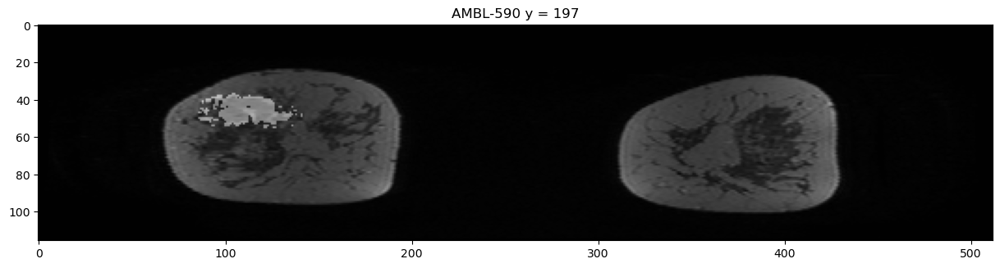

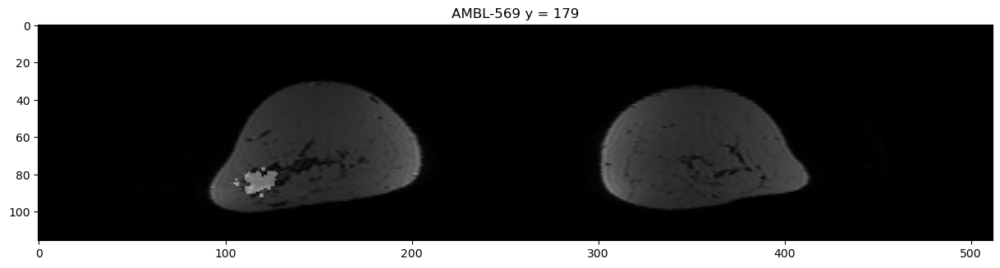

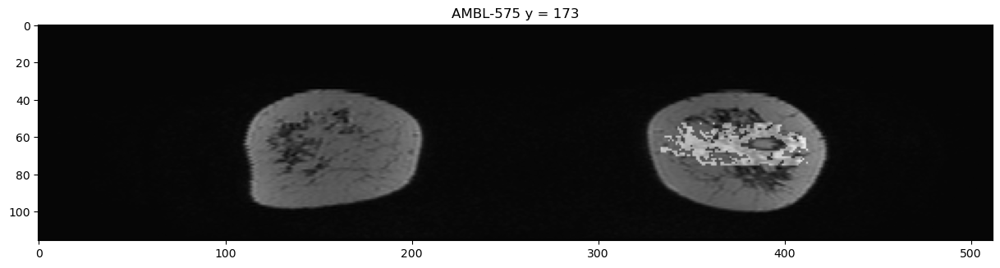

In [37]:
for _, row in top3_y_tumor_df.iterrows():
    slices = read_dicomdir(row["Registered Ax T2 FSE path"])
    model_3d = get_3d_shape(slices)
    
    roi = row["Pixel array"]
    y = int(np.median(row["y_indexes"]))
    plt.figure(figsize = (15,15))
    plt.imshow(model_3d[:, y, :], cmap=plt.cm.gray)
    plt.imshow(roi[:,y,:], cmap=plt.cm.gray, alpha=0.4)
    plt.title(f'{row["Patient ID"]} y = {y}')

##### benign

In [38]:
top3_y_benign_df = lesions_df[lesions_df["tumor/benign"] == 0].sort_values(by="y_offset", ascending=False)[:3]
top3_y_benign_df[["Patient ID", "Registered Ax T2 FSE path", "Slice Location", "Breast", "y_offset", "y_indexes"]]

,Patient ID,Registered Ax T2 FSE path,Slice Location,Breast,y_offset,y_indexes
946,AMBL-590,/media/bendico765/Crucial X9/MRI Lesions/manif...,8.71,L,147,"[107, 108, 109, 110, 111, 112, 113, 114, 115, ..."
1092,AMBL-615,/media/bendico765/Crucial X9/MRI Lesions/manif...,-65.50,R,133,"[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 6..."
769,AMBL-561,/media/bendico765/Crucial X9/MRI Lesions/manif...,-16.72,L,101,"[137, 138, 140, 141, 144, 152, 153, 154, 155, ..."


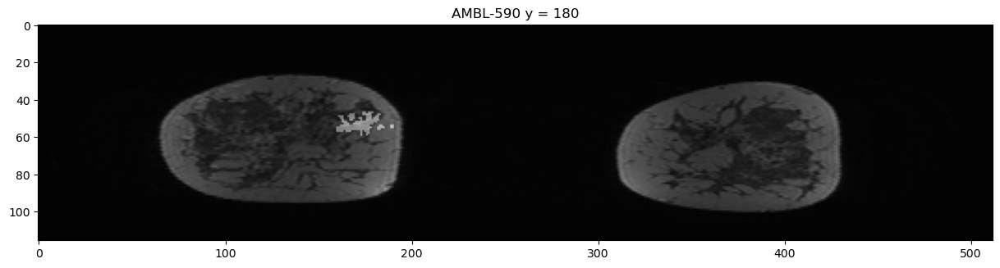

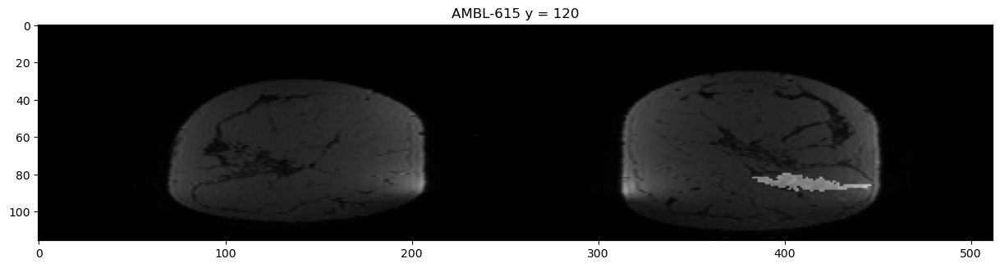

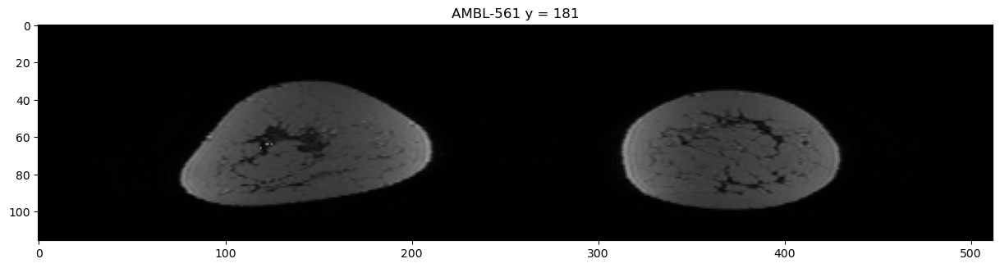

In [39]:
for _, row in top3_y_benign_df.iterrows():
    slices = read_dicomdir(row["Registered Ax T2 FSE path"])
    model_3d = get_3d_shape(slices)
    
    roi = row["Pixel array"]
    y = int(np.median(row["y_indexes"]))
    plt.figure(figsize = (15,15))
    plt.imshow(model_3d[:, y, :], cmap=plt.cm.gray)
    plt.imshow(roi[:,y,:], cmap=plt.cm.gray, alpha=0.4)
    plt.title(f'{row["Patient ID"]} y = {y}')

#### x axis

##### tumor

In [40]:
top3_x_tumor_df = lesions_df[lesions_df["tumor/benign"] == 1].sort_values(by="x_offset", ascending=False)[:3]
top3_x_tumor_df[["Patient ID", "Registered Ax T2 FSE path", "Slice Location", "Breast", "x_offset", "x_indexes"]]

,Patient ID,Registered Ax T2 FSE path,Slice Location,Breast,x_offset,x_indexes
42,AMBL-008,/media/bendico765/Crucial X9/MRI Lesions/manif...,-17.40,L,97,"[98, 99, 100, 101, 102, 103, 104, 105, 106, 10..."
852,AMBL-575,/media/bendico765/Crucial X9/MRI Lesions/manif...,-14.90,R,92,"[328, 329, 330, 331, 332, 333, 334, 335, 336, ..."
1188,AMBL-631,/media/bendico765/Crucial X9/MRI Lesions/manif...,33.93,L,87,"[99, 100, 101, 102, 103, 104, 105, 106, 107, 1..."


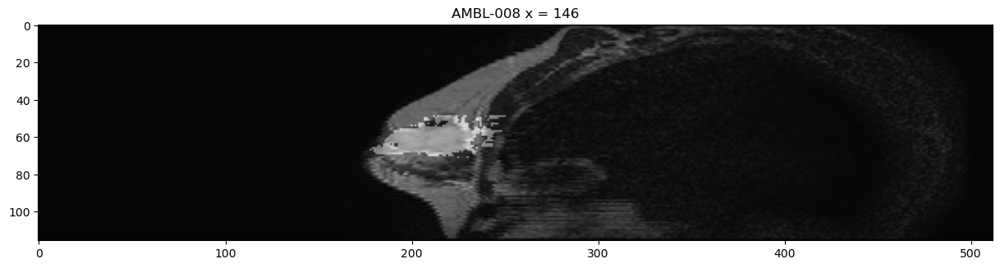

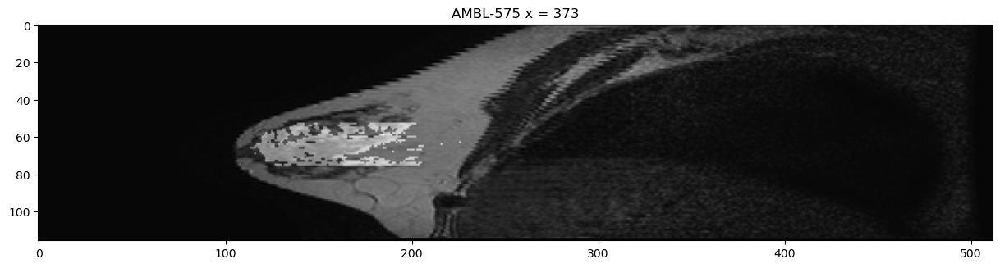

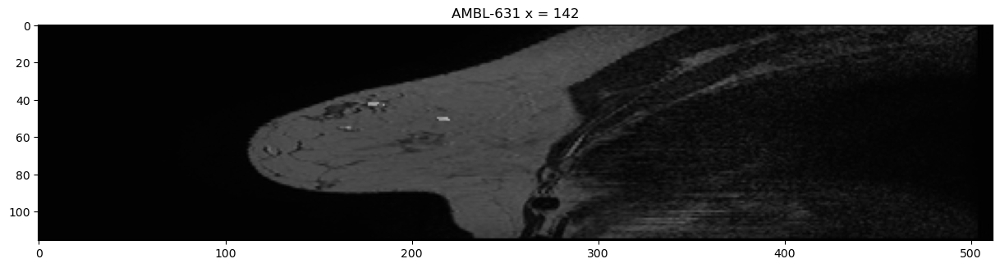

In [41]:
for _, row in top3_x_tumor_df.iterrows():
    slices = read_dicomdir(row["Registered Ax T2 FSE path"])
    model_3d = get_3d_shape(slices)
    
    roi = row["Pixel array"]
    x = int(np.median(row["x_indexes"]))
    plt.figure(figsize = (15,15))
    plt.imshow(model_3d[:, :, x], cmap=plt.cm.gray)
    plt.imshow(roi[:,:,x], cmap=plt.cm.gray, alpha=0.4)
    plt.title(f'{row["Patient ID"]} x = {x}')

##### benign

In [42]:
top3_x_benign_df = lesions_df[lesions_df["tumor/benign"] == 0].sort_values(by="x_offset", ascending=False)[:3]
top3_x_benign_df[["Patient ID", "Registered Ax T2 FSE path", "Slice Location", "Breast", "x_offset", "x_indexes"]]

,Patient ID,Registered Ax T2 FSE path,Slice Location,Breast,x_offset,x_indexes
54,AMBL-010,/media/bendico765/Crucial X9/MRI Lesions/manif...,8.71,R,76,"[336, 337, 338, 339, 340, 341, 342, 343, 344, ..."
1092,AMBL-615,/media/bendico765/Crucial X9/MRI Lesions/manif...,-65.50,R,69,"[380, 381, 382, 383, 384, 385, 386, 387, 388, ..."
930,AMBL-588,/media/bendico765/Crucial X9/MRI Lesions/manif...,46.22,L,62,"[112, 113, 114, 115, 116, 117, 118, 119, 120, ..."


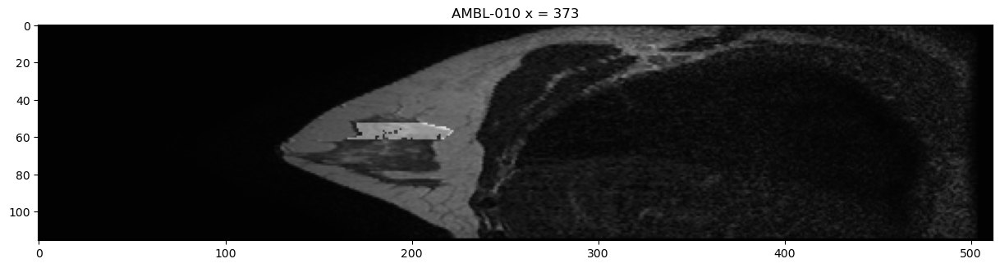

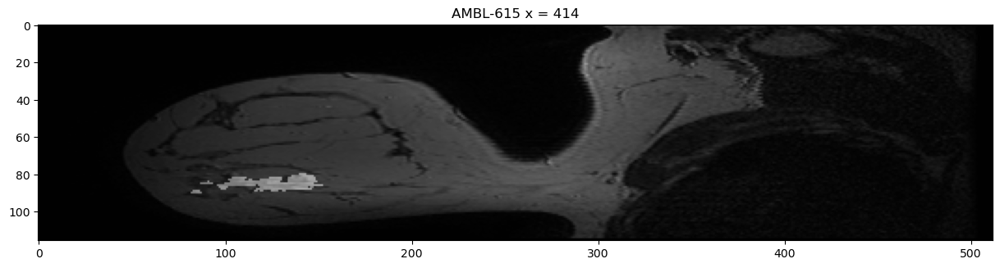

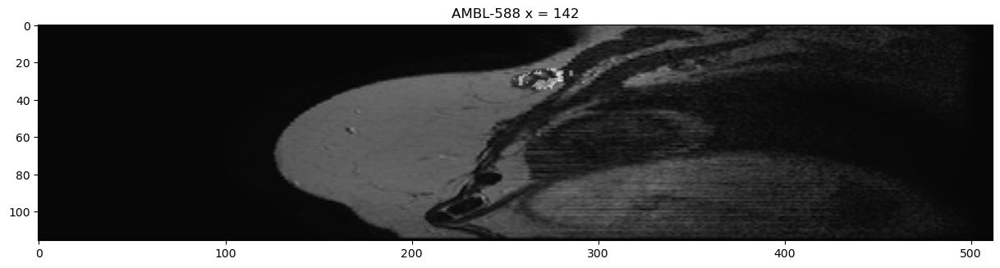

In [43]:
for _, row in top3_x_benign_df.iterrows():
    slices = read_dicomdir(row["Registered Ax T2 FSE path"])
    model_3d = get_3d_shape(slices)
    
    roi = row["Pixel array"]
    x = int(np.median(row["x_indexes"]))
    plt.figure(figsize = (15,15))
    plt.imshow(model_3d[:, :, x], cmap=plt.cm.gray)
    plt.imshow(roi[:,:,x], cmap=plt.cm.gray, alpha=0.4)
    plt.title(f'{row["Patient ID"]} x = {x}')

## Volume

For each lesion compute the total volume

In [6]:
lesions_df["Lesion volume"] = [ 
    np.count_nonzero(
        np.load(row["Roi mask Filepath"])
    )
    for _, row in lesions_df.iterrows()
]
lesions_df.head()

,Patient ID,tumor/benign,Registered Ax T2 FSE path,Slice Location,Breast,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset,Roi mask Filepath,Cleaned Roi mask Filepath,Pixel Spacing,Slice Thickness,RobustScaled Registered Ax T2 FSE path,Lesion volume
0,AMBL-001,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-60.85,L,"[82, 83, 84, 85, 86, 87]","[172, 173, 174, 175, 176, 177, 178, 179, 180, ...","[142, 143, 144, 145, 146, 147, 148, 149, 150, ...",6,42,23,/media/bendico765/Crucial X9/MRI Lesions/Roi m...,/media/bendico765/Crucial X9/MRI Lesions/Clean...,0.6641,2.0,/media/bendico765/Crucial X9/MRI Lesions/Robus...,1463
1,AMBL-001,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-56.85,R,"[82, 83, 84, 85]","[188, 189, 190, 191, 192, 193, 194, 195, 196, ...","[360, 361, 362, 363, 364, 365, 366, 367, 368, ...",4,46,17,/media/bendico765/Crucial X9/MRI Lesions/Roi m...,/media/bendico765/Crucial X9/MRI Lesions/Clean...,0.6641,2.0,/media/bendico765/Crucial X9/MRI Lesions/Robus...,1096
12,AMBL-003,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-2.76,R,"[49, 50, 51, 52, 53, 54, 55]","[178, 179, 180, 181, 182, 183, 184, 185, 186, ...","[357, 358, 359, 360, 361, 362, 363, 364, 365, ...",7,40,21,/media/bendico765/Crucial X9/MRI Lesions/Roi m...,/media/bendico765/Crucial X9/MRI Lesions/Clean...,0.6641,2.0,/media/bendico765/Crucial X9/MRI Lesions/Robus...,741
18,AMBL-004,0.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-51.98,L,"[81, 82, 83, 84, 85]","[163, 164, 165, 166, 167, 168, 169, 170, 171, ...","[147, 148, 149, 150, 151, 152, 153, 154, 155, ...",5,18,13,/media/bendico765/Crucial X9/MRI Lesions/Roi m...,/media/bendico765/Crucial X9/MRI Lesions/Clean...,0.6641,2.0,/media/bendico765/Crucial X9/MRI Lesions/Robus...,387
24,AMBL-005,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-28.46,R,"[54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 6...","[194, 195, 196, 197, 198, 199, 200, 201, 202, ...","[379, 380, 381, 382, 383, 384, 385, 386, 387, ...",13,55,47,/media/bendico765/Crucial X9/MRI Lesions/Roi m...,/media/bendico765/Crucial X9/MRI Lesions/Clean...,0.6641,2.0,/media/bendico765/Crucial X9/MRI Lesions/Robus...,9550


### Plot volume distribution

In [7]:
lesions_df[lesions_df["tumor/benign"] == 0]["Lesion volume"].values

array([  387,   714,   695, 24977,    77,  1087,   640,    78,    56,
         625,   275,    68,    50,  2372,   162,  1456,  2968,   202,
         530,  1301,   565,  1090,  3402,  1001,    37,   243,  1021,
        3102,    83,   419,   238,   393,    74,   328,   436,   108,
          92,   884,   179,   109,   221,   338,   297,  1223,   331,
        3959,  7136,    86,   756,   546,   168,   353,   254,    59,
           7,    16, 14963,    45,    29,  1454,     7,   642,   470,
        2400,   124,   127,   540,   772,  2018,  3774,   258, 13906,
         138,    95,  1232,   143,   616,   299,   811,   321,   284,
         271])

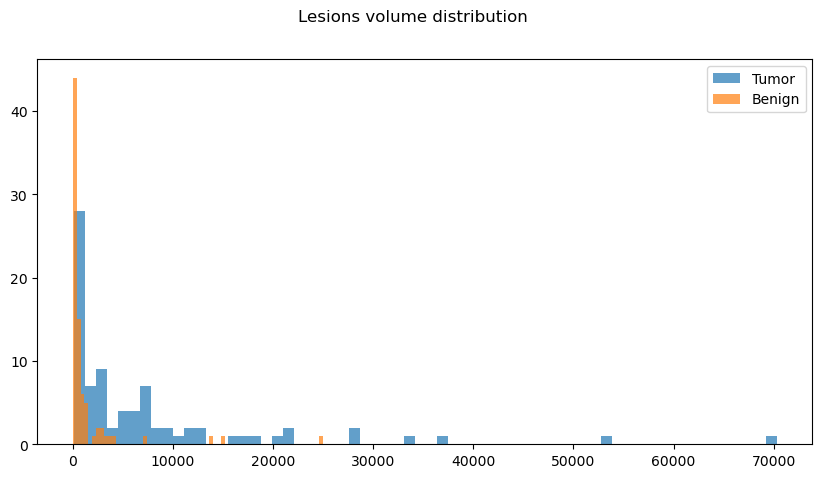

In [8]:
plt.figure(figsize=(10, 5))
plt.suptitle("Lesions volume distribution")

tumor_values = lesions_df[lesions_df["tumor/benign"] == 1]["Lesion volume"].values
benign_values = lesions_df[lesions_df["tumor/benign"] == 0]["Lesion volume"].values

plt.hist(
    tumor_values, 
    bins=get_n_bins(benign_values), #get_n_bins(tumor_values), 
    label="Tumor", 
    alpha = 0.7
)

plt.hist(
    benign_values, 
    bins=get_n_bins(benign_values), 
    label="Benign", 
    alpha = 0.7
)
plt.legend(loc='upper right')

# Display the plot
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/VolumeDistribution")

### Explore the top 3 bigger lesions

In [40]:
lesions_df.sort_values(by="Lesion volume", ascending=False)[:3]

,Patient ID,lesion idx,tumor/benign,Registered Ax T2 FSE path,Roi path,Slice Location,Breast,Pixel array,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset,Lesion volume
852,AMBL-575,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-14.90,R,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 6...","[113, 114, 115, 116, 117, 118, 119, 120, 121, ...","[328, 329, 330, 331, 332, 333, 334, 335, 336, ...",23,122,92,70349
42,AMBL-008,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,-17.40,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 6...","[177, 178, 179, 180, 181, 182, 183, 184, 185, ...","[98, 99, 100, 101, 102, 103, 104, 105, 106, 10...",23,83,97,53600
942,AMBL-590,0,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,/media/bendico765/Crucial X9/MRI Lesions/manif...,37.31,L,"[[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0...","[37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 4...","[126, 127, 129, 130, 131, 132, 133, 134, 135, ...","[75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 8...",19,142,70,37090


#### AMBL-575

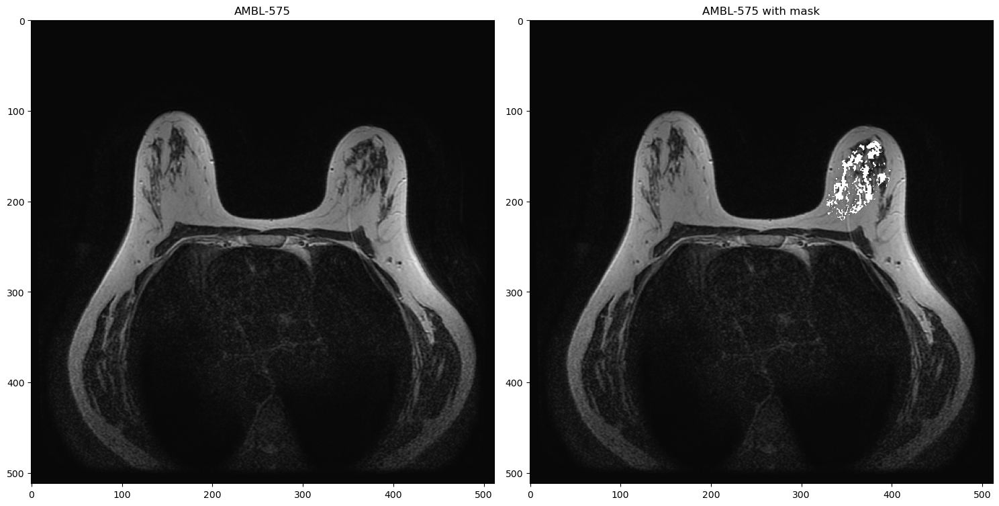

In [55]:
row_id = 852
patient_id = lesions_df.at[row_id, "Patient ID"]
z = lesions_df.at[row_id, "z_indexes"][0]
volume_3d = get_3d_shape(read_dicomdir(lesions_df.at[row_id, "Registered Ax T2 FSE path"]))
lesion_mask = np.load(lesions_df.at[row_id, "Roi mask Filepath"])
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # 1 row, 2 columns

# Display the first image in the first subplot
axes[0].imshow(volume_3d[z, :, :], cmap='grey')
axes[0].set_title(f'{patient_id}')

# Display the second image in the second subplot
axes[1].imshow(volume_3d[z, :, :], cmap='grey')
axes[1].imshow(lesion_mask[z, :, :], cmap='grey', alpha = (lesion_mask[z, :, :] > 0).astype(float))
axes[1].set_title(f'{patient_id} with mask')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

#### AMBL-008

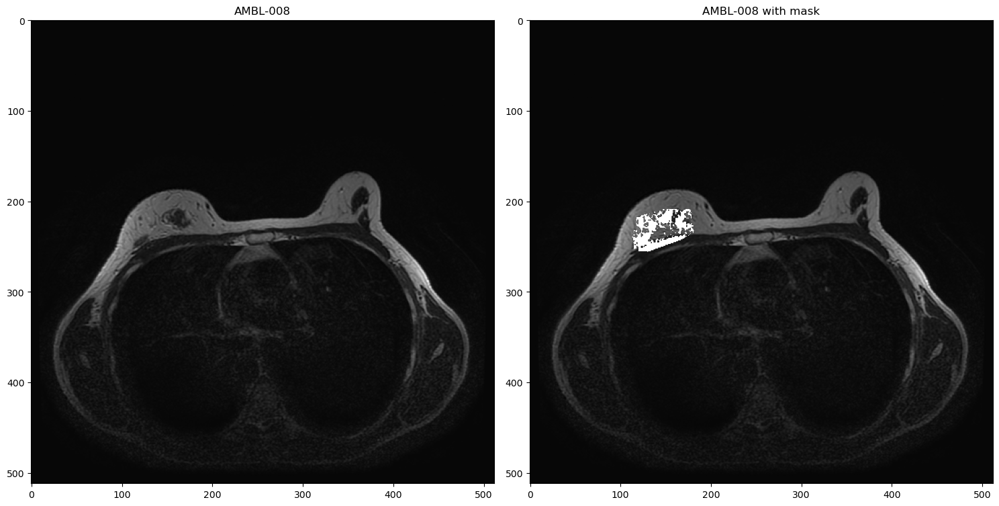

In [56]:
row_id = 42
patient_id = lesions_df.at[row_id, "Patient ID"]
z = lesions_df.at[row_id, "z_indexes"][0]
volume_3d = get_3d_shape(read_dicomdir(lesions_df.at[row_id, "Registered Ax T2 FSE path"]))
lesion_mask = np.load(lesions_df.at[row_id, "Roi mask Filepath"])
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # 1 row, 2 columns

# Display the first image in the first subplot
axes[0].imshow(volume_3d[z, :, :], cmap='grey')
axes[0].set_title(f'{patient_id}')

# Display the second image in the second subplot
axes[1].imshow(volume_3d[z, :, :], cmap='grey')
axes[1].imshow(lesion_mask[z, :, :], cmap='grey', alpha = (lesion_mask[z, :, :] > 0).astype(float))
axes[1].set_title(f'{patient_id} with mask')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

#### AMBL-590

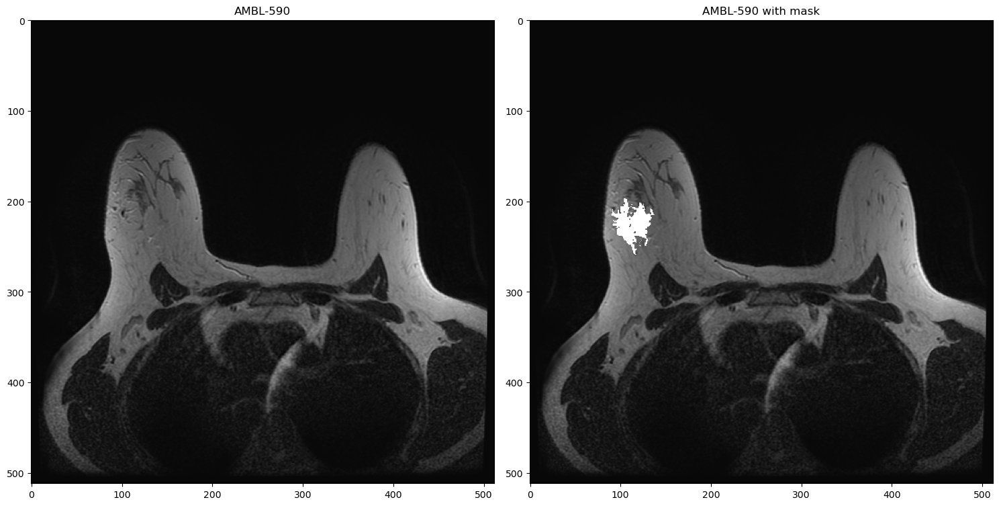

In [57]:
row_id = 942
patient_id = lesions_df.at[row_id, "Patient ID"]
z = lesions_df.at[row_id, "z_indexes"][0]
volume_3d = get_3d_shape(read_dicomdir(lesions_df.at[row_id, "Registered Ax T2 FSE path"]))
lesion_mask = np.load(lesions_df.at[row_id, "Roi mask Filepath"])
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # 1 row, 2 columns

# Display the first image in the first subplot
axes[0].imshow(volume_3d[z, :, :], cmap='grey')
axes[0].set_title(f'{patient_id}')

# Display the second image in the second subplot
axes[1].imshow(volume_3d[z, :, :], cmap='grey')
axes[1].imshow(lesion_mask[z, :, :], cmap='grey', alpha = (lesion_mask[z, :, :] > 0).astype(float))
axes[1].set_title(f'{patient_id} with mask')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

# Disconnected components and holes

In [8]:
df = pd.read_csv("/media/bendico765/Crucial X9/MRI Lesions/lesions_df.csv", index_col=0)
df.head(1)

,Patient ID,tumor/benign,Registered Ax T2 FSE path,Slice Location,Breast,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset,Roi mask Filepath,Cleaned Roi mask Filepath,Pixel Spacing,Slice Thickness,RobustScaled Registered Ax T2 FSE path
0,AMBL-001,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-60.85,L,"[82, 83, 84, 85, 86, 87]","[172, 173, 174, 175, 176, 177, 178, 179, 180, ...","[142, 143, 144, 145, 146, 147, 148, 149, 150, ...",6,42,23,/media/bendico765/Crucial X9/MRI Lesions/Roi m...,/media/bendico765/Crucial X9/MRI Lesions/Clean...,0.6641,2.0,/media/bendico765/Crucial X9/MRI Lesions/Robus...


## Treat image irregularities

### Patient AMBL-562

In [30]:
df[df["Patient ID"] == "AMBL-562"]

,Patient ID,tumor/benign,Registered Ax T2 FSE path,Slice Location,Breast,z_indexes,y_indexes,x_indexes,z_offset,y_offset,x_offset,Roi mask Filepath
774,AMBL-562,1.0,/media/bendico765/Crucial X9/MRI Lesions/manif...,-45.83,R,"[63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 7...","[141, 143, 144, 145, 146, 147, 148, 149, 150, ...","[369, 370, 371, 372, 373, 374, 375, 376, 377, ...",28,105,61,/media/bendico765/Crucial X9/MRI Lesions/Roi m...


In [31]:
get_z_indexes = lambda array: [ z for z in range(array.shape[0]) if np.any(array[z, :, :])]

dicom = get_3d_shape(read_dicomdir(df.at[774, "Registered Ax T2 FSE path"]))
roi = np.load(df.at[774, "Roi mask Filepath"])
z_indexes = df.at[774, "z_indexes"]

In [32]:
labels_mask, num = skimage.measure.label(roi, return_num=True)
z_indexes = get_z_indexes(labels_mask)

In [33]:
num

32

In [34]:
for i in range(1, num+1):
    print(f'{i} {get_z_indexes(np.where(labels_mask == i, labels_mask, 0))}')

1 [63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90]
2 [64]
3 [66]
4 [71]
5 [71]
6 [71]
7 [71]
8 [71]
9 [73]
10 [75]
11 [75]
12 [76]
13 [76]
14 [77]
15 [77]
16 [77]
17 [77]
18 [77]
19 [78]
20 [80]
21 [81]
22 [82]
23 [82]
24 [83]
25 [83]
26 [84]
27 [85]
28 [86]
29 [86]
30 [87]
31 [89]
32 [90]


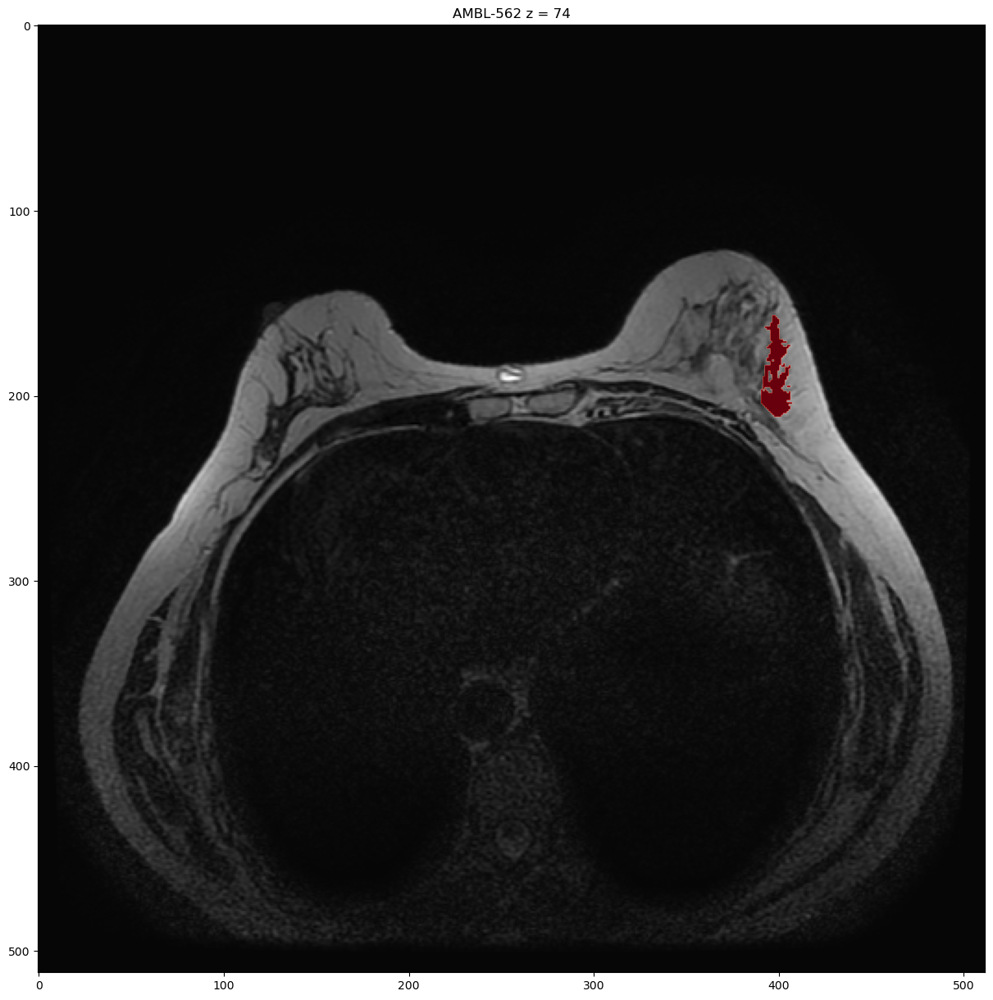

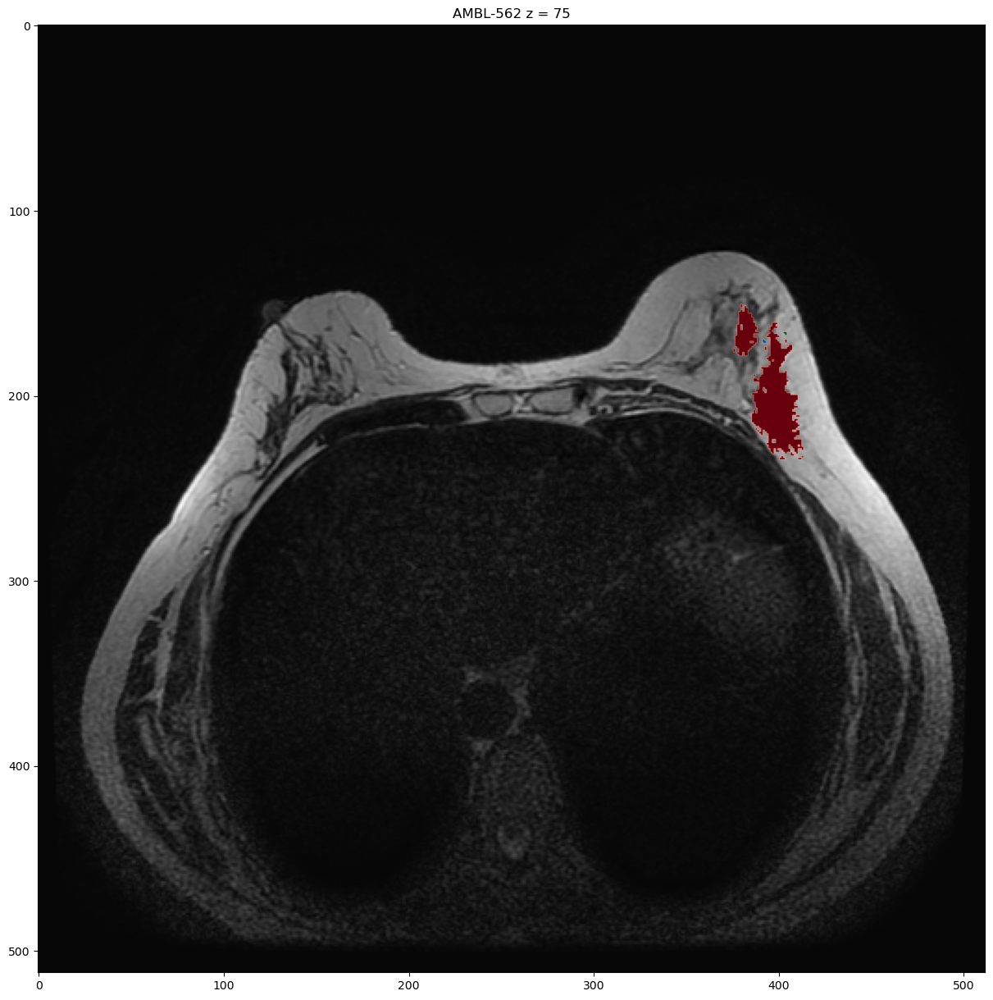

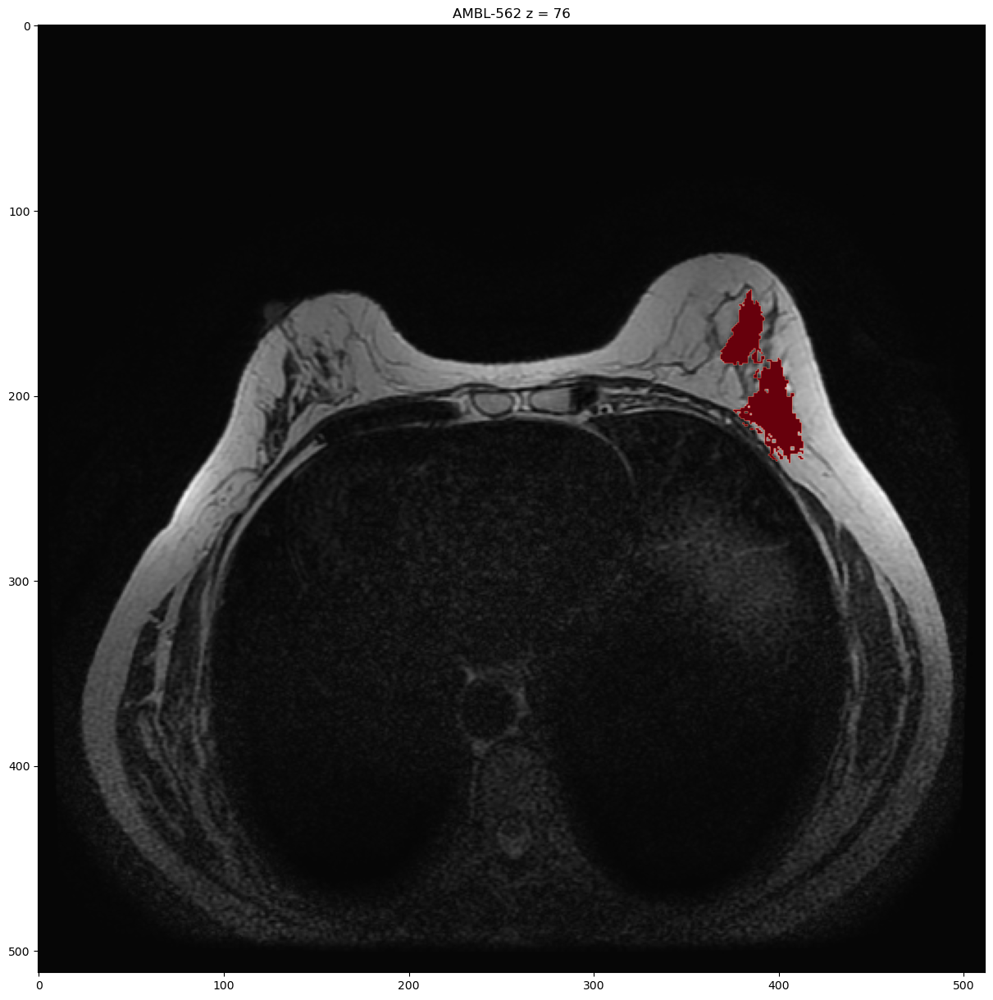

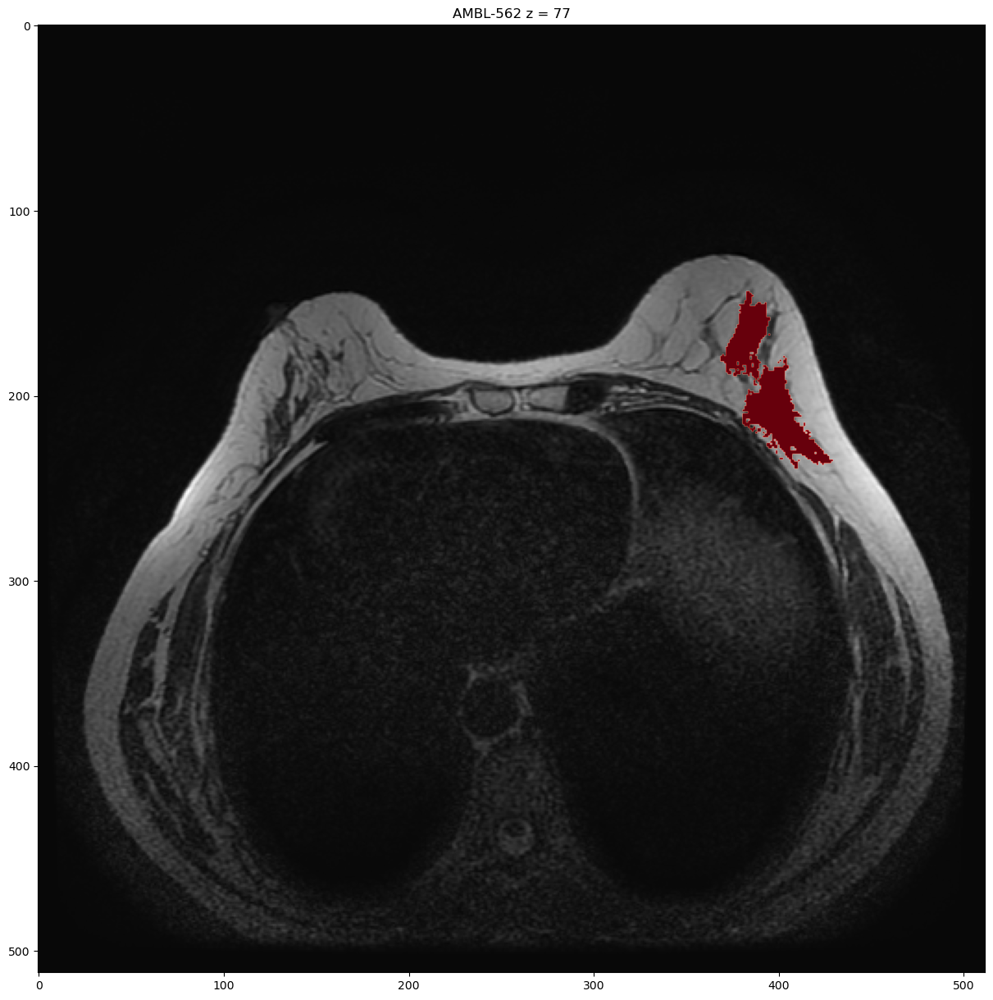

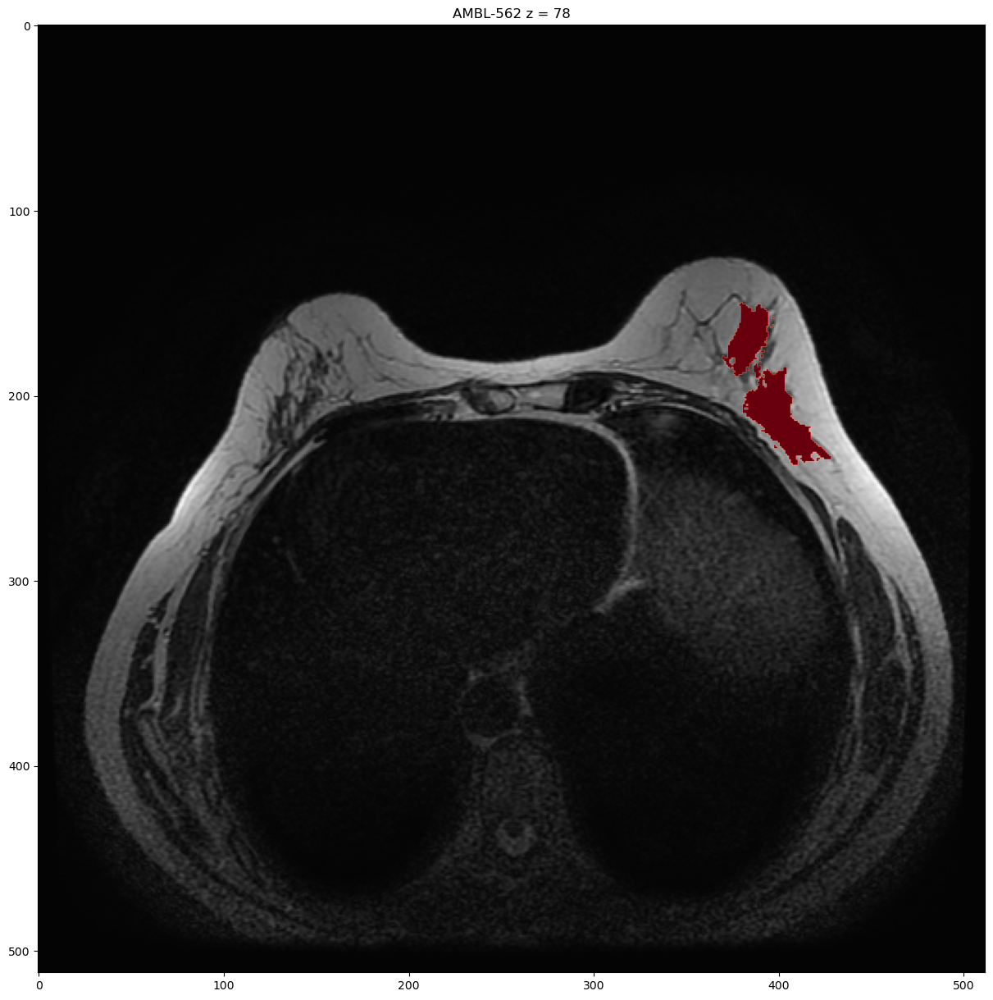

In [35]:
for z in [74, 75, 76, 77, 78]:
    plt.figure(figsize = (15, 15))
    plt.title(f'AMBL-562 z = {z}')
    plt.imshow(dicom[z, :, :], cmap=plt.cm.gray)

    # for each mask, show it 

    # mask 1
    mask = np.where(labels_mask == 1, labels_mask, 0)
    plt.imshow(mask[z, :, :], cmap="Reds", alpha=(mask[z, :, :] > 0).astype(float))
    
    # mask 10
    mask = np.where(labels_mask == 10, labels_mask, 0)
    plt.imshow(mask[z, :, :], cmap="Greens", alpha=(mask[z, :, :] > 0).astype(float))
    
    # mask 11
    mask = np.where(labels_mask == 11, labels_mask, 0)
    plt.imshow(mask[z, :, :], cmap="Blues", alpha=(mask[z, :, :] > 0).astype(float))
    
    # mask 19
    mask = np.where(labels_mask == 19, labels_mask, 0)
    plt.imshow(mask[z, :, :], cmap="Oranges", alpha=(mask[z, :, :] > 0).astype(float))

### Remove disconnected components from the dataset

In [9]:
def cc3d(lung_mask0):
    minimum_cc_sum = np.sum(lung_mask0)*0.4
    minimum_tot_sum = np.sum(lung_mask0)*0.65
    minimum_cc2_sum = np.sum(lung_mask0)*0.3
    lung_mask = lung_mask0.copy()

    # Let us create a binary mask.
    binary_mask = np.round(lung_mask).astype('int')

    # Now, we perform region labelling. This way, every connected component
    # will have their own colour value.
    labelled_mask, num_labels = ndimage.label(binary_mask)

    # Let us now remove all the too small regions.
    for lab in range(num_labels+1):
        if np.sum(lung_mask[labelled_mask == lab]) < minimum_cc_sum:
            lung_mask[labelled_mask == lab] = 0

    if np.sum(lung_mask) < minimum_tot_sum:
        lung_mask = lung_mask0.copy()
        for lab in range(num_labels+1):
            if np.sum(lung_mask[labelled_mask == lab]) < minimum_cc2_sum:
                lung_mask[labelled_mask == lab] = 0

    return np.round(lung_mask)

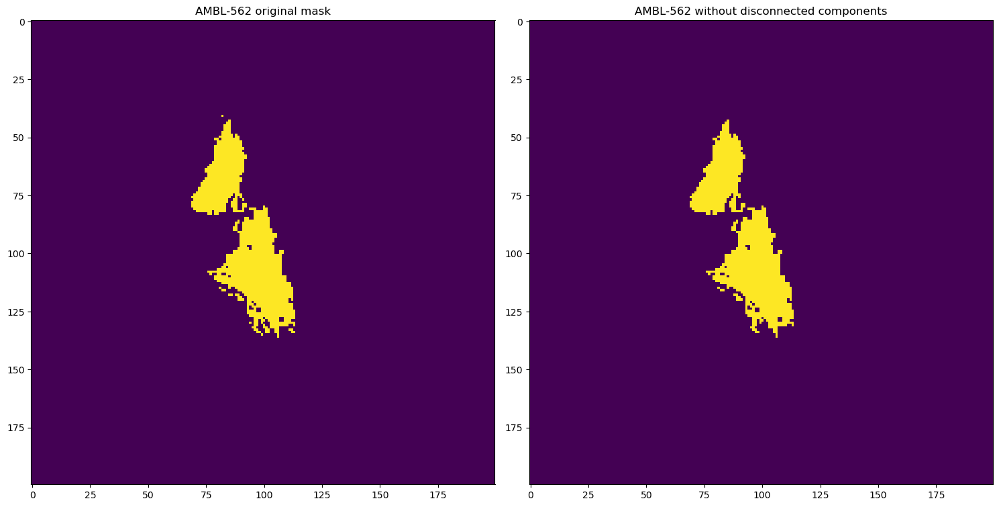

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

# First subplot
axes[0].imshow(np.load(df.at[774, "Roi mask Filepath"])[76][100:300, 300:500])
axes[0].set_title('AMBL-562 original mask')

# Second subplot
removed_compontents = cc3d(np.load(df.at[774, "Roi mask Filepath"]))
axes[1].imshow(removed_compontents[76][100:300, 300:500])
axes[1].set_title('AMBL-562 without disconnected components')

# Adjust layout
plt.tight_layout()

# Display the plot
#plt.show()
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/disconnected_componenets_removal.png")

### Filling voids

In [10]:
fill_voids = lambda mask: ndimage.binary_fill_holes(mask).astype(int)

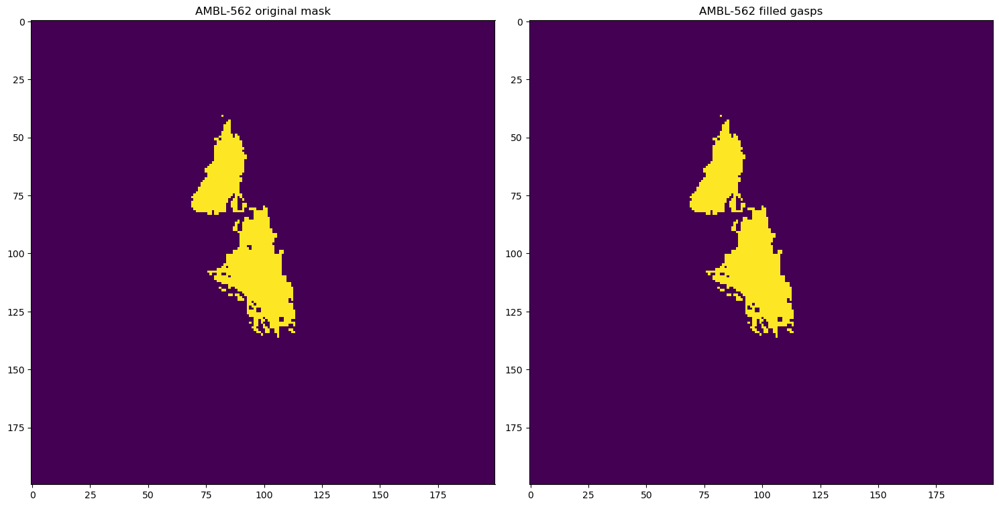

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

# First subplot
axes[0].imshow(np.load(df.at[774, "Roi mask Filepath"])[76][100:300, 300:500])
axes[0].set_title('AMBL-562 original mask')

# Second subplot
axes[1].imshow(fill_voids(np.load(df.at[774, "Roi mask Filepath"]))[76][100:300, 300:500])
axes[1].set_title('AMBL-562 filled gasps')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/filling_holes.png")

### Binary Dilation

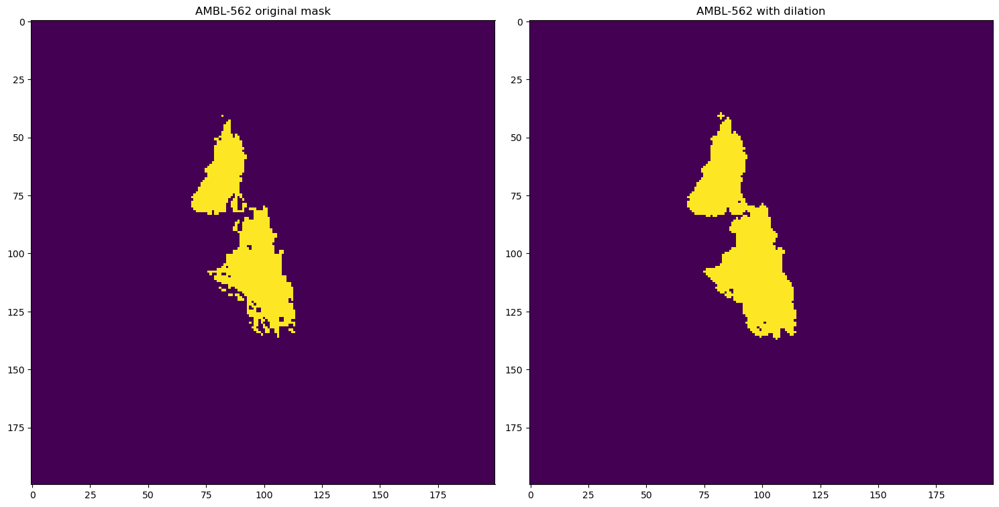

In [40]:
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

# First subplot
axes[0].imshow(np.load(df.at[774, "Roi mask Filepath"])[76][100:300, 300:500])
axes[0].set_title('AMBL-562 original mask')

# Second subplot
axes[1].imshow(ndimage.binary_dilation(np.load(df.at[774, "Roi mask Filepath"])[76][100:300, 300:500]))
axes[1].set_title('AMBL-562 with dilation')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/dilation.png")

### Apply to each ROI

This has to be done by loading the images one by one because memory won't be sufficient

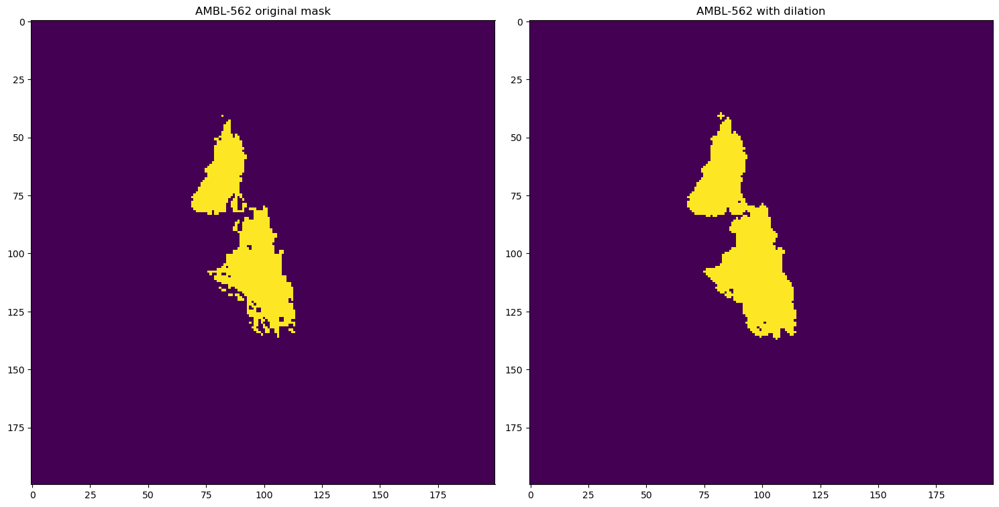

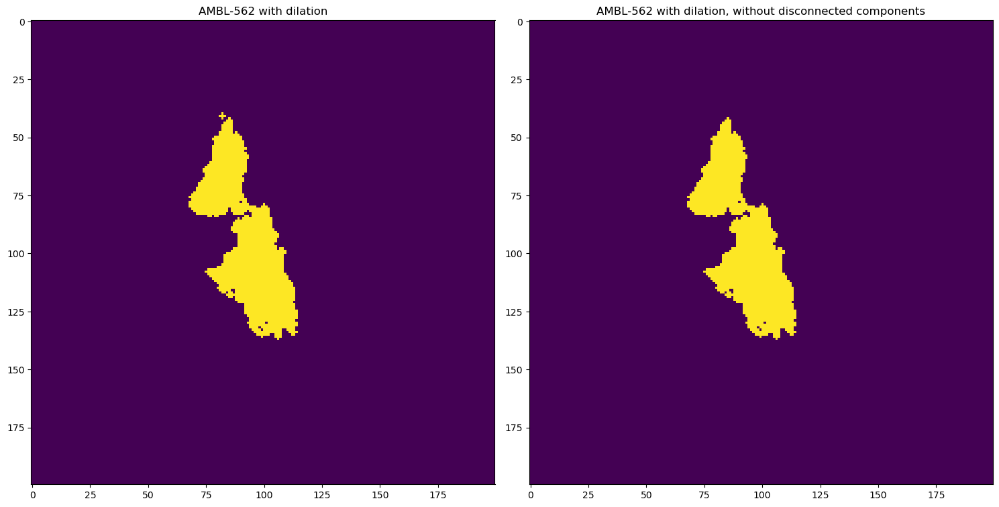

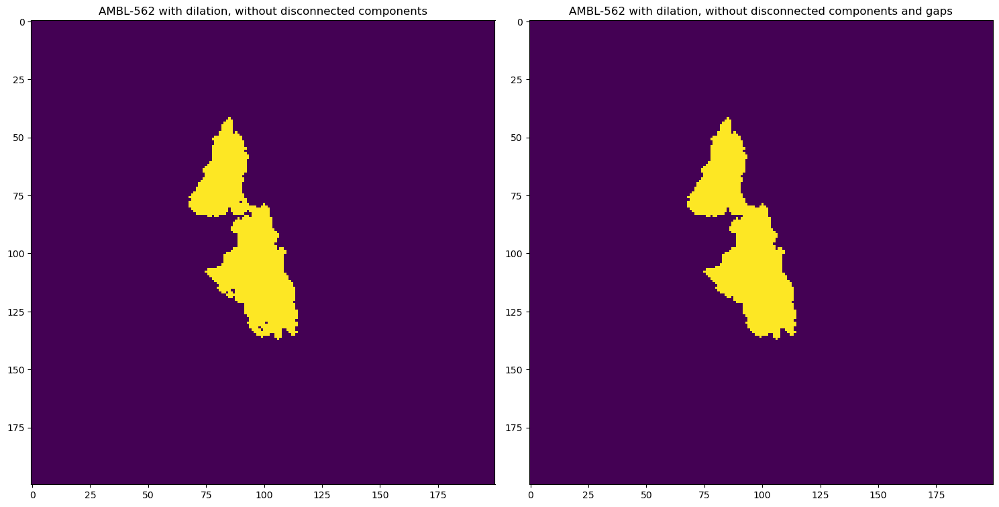

In [16]:
zoomed_roi = np.load(df.at[774, "Roi mask Filepath"])[76][100:300, 300:500]


fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

# First subplot
axes[0].imshow(zoomed_roi)
axes[0].set_title('AMBL-562 original mask')

# Second subplot
axes[1].imshow(ndimage.binary_dilation(zoomed_roi))
axes[1].set_title('AMBL-562 with dilation')

plt.tight_layout()
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/cleaning_phase1")

fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

axes[0].imshow(ndimage.binary_dilation(zoomed_roi))
axes[0].set_title('AMBL-562 with dilation')

axes[1].imshow(cc3d(ndimage.binary_dilation(zoomed_roi)))
axes[1].set_title('AMBL-562 with dilation, without disconnected components')

plt.tight_layout()
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/cleaning_phase2")

fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

axes[0].imshow(cc3d(ndimage.binary_dilation(zoomed_roi)))
axes[0].set_title('AMBL-562 with dilation, without disconnected components')

axes[1].imshow(fill_voids(cc3d(ndimage.binary_dilation(zoomed_roi))))
axes[1].set_title('AMBL-562 with dilation, without disconnected components and gaps')

plt.tight_layout()
plt.savefig("/media/bendico765/Crucial X9/MRI Lesions/figures/cleaning_phase3")

In [ ]:
target_path = "/media/bendico765/Crucial X9/MRI Lesions"
folder_name = "Cleaned Roi masks"

# create the directory for the numpy files
try:
    os.mkdir(f"{target_path}/{folder_name}")
except FileExistsError:
    pass

cleaned_roi_filepaths = []
for patient_id in df["Patient ID"].unique():
    # create the directory for the patient roi files
    try:
        os.mkdir(f"{target_path}/{folder_name}/{patient_id}")
    except FileExistsError:
        pass
        
    for index, (_, row) in enumerate(df[df["Patient ID"] == patient_id].iterrows()):
        filepath = f"{target_path}/{folder_name}/{patient_id}/ROI {index}.npy"
        
        # load the lesion volume
        mask_volume = np.load(row["Roi mask Filepath"])
        
        # for each volume, fill gasps and remove disconnected componenets
        mask_volume = fill_voids(cc3d(ndimage.binary_dilation(mask_volume)))
    
        np.save(filepath, mask_volume)
        cleaned_roi_filepaths.append(filepath)

with open(f"{target_path}/{folder_name}/README.txt", "w") as file:
    file.write("Maschere ROI a cui sono state rimosse le componenti disconnesse e i buchi, in formato npy")

df["Cleaned Roi mask Filepath"] = cleaned_roi_filepaths

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(15, 15))  # Adjust figure size as needed

# First subplot
axes[0].imshow(np.load("/media/bendico765/Crucial X9/MRI Lesions/Roi masks/AMBL-001/ROI 0.npy")[83][150:250, 100:200])
axes[0].set_title('AMBL-001 original mask')

# Second subplot
axes[1].imshow(np.load("/media/bendico765/Crucial X9/MRI Lesions/Cleaned Roi masks/AMBL-001/ROI 0.npy")[83][150:250, 100:200])
axes[1].set_title('AMBL-001 after being cleaned')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

In [ ]:
df.head(1)

In [ ]:
df.to_csv("/media/bendico765/Crucial X9/MRI Lesions/lesions_df.csv")